# Context-Safe Hybrid vs Singular Reporting v4

This version recomputes structural FLOPs and parameter reductions from the saved pruned model checkpoints. CSV files are used only to locate checkpoints and recover context metadata, stack ids, singular method ids, and layerwise policy descriptions.

Accuracy and pruning time are still read from the benchmark artifact index unless a future full evaluation pass is enabled.

In [1]:
from pathlib import Path
import json
import subprocess
import sys

import pandas as pd
from IPython.display import Image, Markdown, display

PROJECT_ROOT = Path.cwd()
V4_REPORT_DIR = PROJECT_ROOT / "report_artifacts" / "context_safe_hybrid_singular_report_v4_model_metrics"
TOP_K_PER_CONTEXT = int(globals().get("TOP_K_PER_CONTEXT", 4))
RUN_V4_BUILDER = bool(globals().get("RUN_V4_BUILDER", True))
MAX_INLINE_V4_COMPARISON_PLOTS = globals().get("MAX_INLINE_V4_COMPARISON_PLOTS", 80)
SHOW_ROWS = int(globals().get("SHOW_ROWS", 80))

if RUN_V4_BUILDER:
    cmd = [
        sys.executable,
        str(PROJECT_ROOT / "scripts" / "build_context_safe_report_v4_from_checkpoints.py"),
        "--top-k",
        str(TOP_K_PER_CONTEXT),
        "--report-dir",
        str(V4_REPORT_DIR),
    ]
    result = subprocess.run(cmd, cwd=PROJECT_ROOT, text=True, capture_output=True)
    print(result.stdout)
    if result.returncode:
        print(result.stderr)
        raise RuntimeError(f"v4 checkpoint report builder failed with exit code {result.returncode}")

TABLE_DIR = V4_REPORT_DIR / "tables"
PLOT_DIR = V4_REPORT_DIR / "plots" / "comparisons"
display(Markdown(f"Report directory: `{V4_REPORT_DIR}`"))

{
  "report_dir": "c:\\Users\\alber\\activation-based-pruning\\report_artifacts\\context_safe_hybrid_singular_report_v4_model_metrics",
  "tables_dir": "c:\\Users\\alber\\activation-based-pruning\\report_artifacts\\context_safe_hybrid_singular_report_v4_model_metrics\\tables",
  "plots_dir": "c:\\Users\\alber\\activation-based-pruning\\report_artifacts\\context_safe_hybrid_singular_report_v4_model_metrics\\plots\\comparisons",
  "top_k": 4,
  "device": "cpu",
  "counts": {
    "checkpoint_index_rows": 1352,
    "metrics_rows": 1352,
    "metrics_ok_rows": 1097,
    "comparison_rows": 6120,
    "comparison_plots": 128,
    "layerwise_direct_rows": 4129
  },
  "notes": [
    "FLOPs and params are recomputed from checkpoint-loaded model objects.",
    "Accuracy and pruning time remain indexed from benchmark artifacts unless a future eval pass is enabled.",
    "CSV artifacts are used only for context/linkage, not for direct structural FLOPs."
  ]
}



Report directory: `c:\Users\alber\activation-based-pruning\report_artifacts\context_safe_hybrid_singular_report_v4_model_metrics`

In [2]:
def read_table(name):
    path = TABLE_DIR / name
    if not path.exists() or path.stat().st_size == 0:
        return pd.DataFrame()
    try:
        return pd.read_csv(path)
    except pd.errors.EmptyDataError:
        return pd.DataFrame()

def show_table(title, df, sort_cols=None, n=SHOW_ROWS):
    display(Markdown(f"### {title}"))
    if df.empty:
        display(Markdown("No rows available."))
        return
    out = df.copy()
    cols = [c for c in (sort_cols or []) if c in out.columns]
    if cols:
        out = out.sort_values(cols, kind="mergesort")
    display(out.head(n))

CONTEXT_SORT = ["objective_label", "dataset", "model", "scope", "ratio", "context_rank", "report_stack_id"]
qc = read_table("v4_qc_summary.csv")
index_df = read_table("v4_checkpoint_model_index.csv")
metrics_df = read_table("v4_checkpoint_direct_model_metrics.csv")
comparison_df = read_table("v4_hybrid_vs_singular_checkpoint_direct_long.csv")
layerwise_direct_df = read_table("v4_hybrid_layerwise_policy_linked_to_direct_metrics.csv")
plot_manifest = read_table("v4_plot_manifest_checkpoint_comparisons.csv")

show_table("V4 QC summary", qc)
show_table("Checkpoint model index", index_df, CONTEXT_SORT)
show_table("Checkpoint-derived direct model metrics", metrics_df, CONTEXT_SORT + ["record_type", "method"])
show_table("Hybrid vs same-context singular comparison, long format", comparison_df, CONTEXT_SORT + ["metric", "singular_method_display"])
show_table("Hybrid layerwise policies linked to direct checkpoint metrics", layerwise_direct_df, CONTEXT_SORT + ["layer_index"])

failed = metrics_df[metrics_df.get("metric_status", pd.Series(dtype=str)).astype(str).ne("ok")].copy() if not metrics_df.empty else pd.DataFrame()
show_table("Unresolved or failed checkpoint metrics", failed, CONTEXT_SORT + ["record_type", "method"], n=200)

### V4 QC summary

,metric,value
0,checkpoint_index_rows,1352
1,metrics_rows,1352
2,metrics_ok_rows,1097
3,comparison_rows,6120
4,comparison_plots,128
5,layerwise_direct_rows,4129


### Checkpoint model index

,run_id,run_dir,dataset,model,objective,objective_label,timestamp,manifest_path,manifest_schema_version,notebook_path,...,point_label,cache_key,cache_source_run_id,cache_source_run_stamp,hybrid_objective,hybrid_objective_label,hybrid_context_rank,hybrid_report_stack_id,hybrid_stack_id,hybrid_selected_methods
394,lfpc_cifar10_resnet18_flops_accuracy_20260521_...,outputs\lfpc_hybrid\cifar10\resnet18\flops_acc...,CIFAR-10,ResNet18,flops_accuracy,FLOPs + Accuracy,20260521_115829,outputs\lfpc_hybrid\cifar10\resnet18\flops_acc...,2026-05-20.1,NaN,...,Hybrid 5484,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
404,lfpc_cifar10_resnet18_flops_accuracy_20260521_...,outputs\lfpc_hybrid\cifar10\resnet18\flops_acc...,CIFAR-10,ResNet18,flops_accuracy,FLOPs + Accuracy,20260521_115829,outputs\lfpc_hybrid\cifar10\resnet18\flops_acc...,2026-05-20.1,NaN,...,Hybrid 9000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
414,lfpc_cifar10_resnet18_flops_accuracy_20260521_...,outputs\lfpc_hybrid\cifar10\resnet18\flops_acc...,CIFAR-10,ResNet18,flops_accuracy,FLOPs + Accuracy,20260521_115829,outputs\lfpc_hybrid\cifar10\resnet18\flops_acc...,2026-05-20.1,NaN,...,Hybrid 9245,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
424,lfpc_cifar10_resnet18_flops_accuracy_20260521_...,outputs\lfpc_hybrid\cifar10\resnet18\flops_acc...,CIFAR-10,ResNet18,flops_accuracy,FLOPs + Accuracy,20260521_115829,outputs\lfpc_hybrid\cifar10\resnet18\flops_acc...,2026-05-20.1,NaN,...,Hybrid 4661,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
434,lfpc_cifar10_resnet18_flops_accuracy_20260521_...,outputs\lfpc_hybrid\cifar10\resnet18\flops_acc...,CIFAR-10,ResNet18,flops_accuracy,FLOPs + Accuracy,20260521_115829,outputs\lfpc_hybrid\cifar10\resnet18\flops_acc...,2026-05-20.1,NaN,...,Hybrid 3583,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
658,lfpc_CIFAR-10_VGG16_flops_accuracy_20260512_18...,outputs\lfpc_hybrid\cifar10\vgg16\flops_accura...,CIFAR-10,VGG16,flops_accuracy,FLOPs + Accuracy,20260512_183602,NaN,NaN,NaN,...,NISP,CIFAR-10__VGG16__local__r0.3__custom_nisp,lfpc_CIFAR-10_VGG16_flops_accuracy_20260512_18...,20260512_183602,flops_accuracy,FLOPs + Accuracy,3.0,1892.0,LFPC_flops_accuracy_cifar10_vgg16_local_r0.3_v...,"['custom_spectral_energy', 'custom_hrank', 'ap..."
659,lfpc_CIFAR-10_VGG16_flops_accuracy_20260512_18...,outputs\lfpc_hybrid\cifar10\vgg16\flops_accura...,CIFAR-10,VGG16,flops_accuracy,FLOPs + Accuracy,20260512_183602,NaN,NaN,NaN,...,REPrune,CIFAR-10__VGG16__local__r0.3__custom_reprune,lfpc_CIFAR-10_VGG16_flops_accuracy_20260512_18...,20260512_183602,flops_accuracy,FLOPs + Accuracy,3.0,1892.0,LFPC_flops_accuracy_cifar10_vgg16_local_r0.3_v...,"['custom_spectral_energy', 'custom_hrank', 'ap..."
661,lfpc_CIFAR-10_VGG16_flops_accuracy_20260512_18...,outputs\lfpc_hybrid\cifar10\vgg16\flops_accura...,CIFAR-10,VGG16,flops_accuracy,FLOPs + Accuracy,20260512_183602,NaN,NaN,NaN,...,TIS,CIFAR-10__VGG16__local__r0.3__custom_tis,lfpc_CIFAR-10_VGG16_flops_accuracy_20260512_18...,20260512_183602,flops_accuracy,FLOPs + Accuracy,3.0,1892.0,LFPC_flops_accuracy_cifar10_vgg16_local_r0.3_v...,"['custom_spectral_energy', 'custom_hrank', 'ap..."
666,lfpc_CIFAR-10_VGG16_flops_accuracy_20260512_18...,outputs\lfpc_hybrid\cifar10\vgg16\flops_accura...,CIFAR-10,VGG16,flops_accuracy,FLOPs + Accuracy,20260512_183602,NaN,NaN,NaN,...,CHIP,CIFAR-10__VGG16__local__r0.3__chip,lfpc_CIFAR-10_VGG16_flops_accuracy_20260512_18...,20260512_183602,flops_accuracy,FLOPs + Accuracy,4.0,8248.0,LFPC_flops_accuracy_cifar10_vgg16_local_r0.3_v...,"['custom_spectral_energy', 'custom_hrank', 'ap..."


### Checkpoint-derived direct model metrics

,run_id,run_dir,dataset,model,objective,objective_label,timestamp,manifest_path,manifest_schema_version,notebook_path,...,checkpoint_payload_model_key,checkpoint_metadata_json,direct_input_shape,direct_num_classes,direct_baseline_flops,direct_model_flops,direct_flops_reduction_pct,direct_baseline_params,direct_model_params,direct_params_reduction_pct
394,lfpc_cifar10_resnet18_flops_accuracy_20260521_...,outputs\lfpc_hybrid\cifar10\resnet18\flops_acc...,CIFAR-10,ResNet18,flops_accuracy,FLOPs + Accuracy,20260521_115829,outputs\lfpc_hybrid\cifar10\resnet18\flops_acc...,2026-05-20.1,NaN,...,model,"{""dataset"": ""cifar10"", ""model"": ""resnet18"", ""b...",3x32x32,10.0,555422720.0,416132254.0,25.078280,11173962.0,7987583.0,28.516107
404,lfpc_cifar10_resnet18_flops_accuracy_20260521_...,outputs\lfpc_hybrid\cifar10\resnet18\flops_acc...,CIFAR-10,ResNet18,flops_accuracy,FLOPs + Accuracy,20260521_115829,outputs\lfpc_hybrid\cifar10\resnet18\flops_acc...,2026-05-20.1,NaN,...,model,"{""dataset"": ""cifar10"", ""model"": ""resnet18"", ""b...",3x32x32,10.0,555422720.0,340681504.0,38.662663,11173962.0,4127822.0,63.058564
414,lfpc_cifar10_resnet18_flops_accuracy_20260521_...,outputs\lfpc_hybrid\cifar10\resnet18\flops_acc...,CIFAR-10,ResNet18,flops_accuracy,FLOPs + Accuracy,20260521_115829,outputs\lfpc_hybrid\cifar10\resnet18\flops_acc...,2026-05-20.1,NaN,...,model,"{""dataset"": ""cifar10"", ""model"": ""resnet18"", ""b...",3x32x32,10.0,555422720.0,141914234.0,74.449329,11173962.0,4527838.0,59.478670
424,lfpc_cifar10_resnet18_flops_accuracy_20260521_...,outputs\lfpc_hybrid\cifar10\resnet18\flops_acc...,CIFAR-10,ResNet18,flops_accuracy,FLOPs + Accuracy,20260521_115829,outputs\lfpc_hybrid\cifar10\resnet18\flops_acc...,2026-05-20.1,NaN,...,model,"{""dataset"": ""cifar10"", ""model"": ""resnet18"", ""b...",3x32x32,10.0,555422720.0,218764394.0,60.612991,11173962.0,2909936.0,73.957885
434,lfpc_cifar10_resnet18_flops_accuracy_20260521_...,outputs\lfpc_hybrid\cifar10\resnet18\flops_acc...,CIFAR-10,ResNet18,flops_accuracy,FLOPs + Accuracy,20260521_115829,outputs\lfpc_hybrid\cifar10\resnet18\flops_acc...,2026-05-20.1,NaN,...,model,"{""dataset"": ""cifar10"", ""model"": ""resnet18"", ""b...",3x32x32,10.0,555422720.0,199229518.0,64.130110,11173962.0,2221713.0,80.117052
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
211,lfpc_CIFAR-10_VGG16_flops_accuracy_20260512_18...,outputs\lfpc_hybrid\cifar10\vgg16\flops_accura...,CIFAR-10,VGG16,flops_accuracy,FLOPs + Accuracy,20260512_183602,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
225,lfpc_CIFAR-10_VGG16_flops_accuracy_20260512_18...,outputs\lfpc_hybrid\cifar10\vgg16\flops_accura...,CIFAR-10,VGG16,flops_accuracy,FLOPs + Accuracy,20260512_183602,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
239,lfpc_CIFAR-10_VGG16_flops_accuracy_20260512_18...,outputs\lfpc_hybrid\cifar10\vgg16\flops_accura...,CIFAR-10,VGG16,flops_accuracy,FLOPs + Accuracy,20260512_183602,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
631,lfpc_CIFAR-10_VGG16_flops_accuracy_20260512_18...,outputs\lfpc_hybrid\cifar10\vgg16\flops_accura...,CIFAR-10,VGG16,flops_accuracy,FLOPs + Accuracy,20260512_183602,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Hybrid vs same-context singular comparison, long format

,objective,objective_label,dataset,model,scope,ratio,context_rank,report_stack_id,stack_id,selected_methods,singular_method,singular_method_display,metric,metric_source,hybrid_value,singular_value,hybrid_advantage_vs_singular
1794,flops_accuracy,FLOPs + Accuracy,CIFAR-10,ResNet18,global,0.3,1.0,5484.0,LFPC_flops_accuracy_cifar10_resnet18_global_r0...,"['chip', 'custom_thinet', 'custom_nisp', 'cust...",custom_autodfp,AutoDFP,accuracy_delta_pp,artifact_index,12.170000,13.160000,-0.990000
1789,flops_accuracy,FLOPs + Accuracy,CIFAR-10,ResNet18,global,0.3,1.0,5484.0,LFPC_flops_accuracy_cifar10_resnet18_global_r0...,"['chip', 'custom_thinet', 'custom_nisp', 'cust...",chip,CHIP,accuracy_delta_pp,artifact_index,12.170000,13.580000,-1.410000
1799,flops_accuracy,FLOPs + Accuracy,CIFAR-10,ResNet18,global,0.3,1.0,5484.0,LFPC_flops_accuracy_cifar10_resnet18_global_r0...,"['chip', 'custom_thinet', 'custom_nisp', 'cust...",custom_dcp,DCP,accuracy_delta_pp,artifact_index,12.170000,11.730000,0.440000
1804,flops_accuracy,FLOPs + Accuracy,CIFAR-10,ResNet18,global,0.3,1.0,5484.0,LFPC_flops_accuracy_cifar10_resnet18_global_r0...,"['chip', 'custom_thinet', 'custom_nisp', 'cust...",custom_gfs,GFS,accuracy_delta_pp,artifact_index,12.170000,11.500000,0.670000
1809,flops_accuracy,FLOPs + Accuracy,CIFAR-10,ResNet18,global,0.3,1.0,5484.0,LFPC_flops_accuracy_cifar10_resnet18_global_r0...,"['chip', 'custom_thinet', 'custom_nisp', 'cust...",custom_nisp,NISP,accuracy_delta_pp,artifact_index,12.170000,12.720000,-0.550000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1846,flops_accuracy,FLOPs + Accuracy,CIFAR-10,ResNet18,global,0.3,2.0,9000.0,LFPC_flops_accuracy_cifar10_resnet18_global_r0...,"['custom_thinet', 'custom_reprune', 'custom_ti...",custom_gfs,GFS,direct_params_reduction_pct,checkpoint_direct,63.058564,59.420723,3.637841
1851,flops_accuracy,FLOPs + Accuracy,CIFAR-10,ResNet18,global,0.3,2.0,9000.0,LFPC_flops_accuracy_cifar10_resnet18_global_r0...,"['custom_thinet', 'custom_reprune', 'custom_ti...",custom_nisp,NISP,direct_params_reduction_pct,checkpoint_direct,63.058564,59.486707,3.571858
1856,flops_accuracy,FLOPs + Accuracy,CIFAR-10,ResNet18,global,0.3,2.0,9000.0,LFPC_flops_accuracy_cifar10_resnet18_global_r0...,"['custom_thinet', 'custom_reprune', 'custom_ti...",custom_reprune,REPrune,direct_params_reduction_pct,checkpoint_direct,63.058564,37.714062,25.344502
1861,flops_accuracy,FLOPs + Accuracy,CIFAR-10,ResNet18,global,0.3,2.0,9000.0,LFPC_flops_accuracy_cifar10_resnet18_global_r0...,"['custom_thinet', 'custom_reprune', 'custom_ti...",custom_senpis,SeNPIS,direct_params_reduction_pct,checkpoint_direct,63.058564,60.054554,3.004011


### Hybrid layerwise policies linked to direct checkpoint metrics

,objective,dataset,model,scope,ratio,objective_label,variance_threshold,spearman_threshold,jaccard_threshold,context_rank,...,selected_methods,metric_status,metric_error,checkpoint_path_resolved,direct_baseline_flops,direct_model_flops,direct_flops_reduction_pct,direct_baseline_params,direct_model_params,direct_params_reduction_pct
1263,flops_accuracy,CIFAR-10,ResNet18,global,0.30,FLOPs + Accuracy,0.05,0.5,0.7,1,...,"['chip', 'custom_thinet', 'custom_nisp', 'cust...",ok,NaN,C:\Users\alber\activation-based-pruning\output...,555422720.0,416132254.0,25.078280,11173962.0,7987583.0,28.516107
1264,flops_accuracy,CIFAR-10,ResNet18,global,0.30,FLOPs + Accuracy,0.05,0.5,0.7,1,...,"['chip', 'custom_thinet', 'custom_nisp', 'cust...",ok,NaN,C:\Users\alber\activation-based-pruning\output...,555422720.0,416132254.0,25.078280,11173962.0,7987583.0,28.516107
1265,flops_accuracy,CIFAR-10,ResNet18,global,0.30,FLOPs + Accuracy,0.05,0.5,0.7,1,...,"['chip', 'custom_thinet', 'custom_nisp', 'cust...",ok,NaN,C:\Users\alber\activation-based-pruning\output...,555422720.0,416132254.0,25.078280,11173962.0,7987583.0,28.516107
1266,flops_accuracy,CIFAR-10,ResNet18,global,0.30,FLOPs + Accuracy,0.05,0.5,0.7,1,...,"['chip', 'custom_thinet', 'custom_nisp', 'cust...",ok,NaN,C:\Users\alber\activation-based-pruning\output...,555422720.0,416132254.0,25.078280,11173962.0,7987583.0,28.516107
1267,flops_accuracy,CIFAR-10,ResNet18,global,0.30,FLOPs + Accuracy,0.05,0.5,0.7,1,...,"['chip', 'custom_thinet', 'custom_nisp', 'cust...",ok,NaN,C:\Users\alber\activation-based-pruning\output...,555422720.0,416132254.0,25.078280,11173962.0,7987583.0,28.516107
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1338,flops_accuracy,CIFAR-10,ResNet18,global,0.55,FLOPs + Accuracy,0.05,0.5,0.5,1,...,"['chip', 'custom_reprune', 'custom_autodfp', '...",ok,NaN,C:\Users\alber\activation-based-pruning\output...,555422720.0,218764394.0,60.612991,11173962.0,2909936.0,73.957885
1339,flops_accuracy,CIFAR-10,ResNet18,global,0.55,FLOPs + Accuracy,0.05,0.5,0.5,1,...,"['chip', 'custom_reprune', 'custom_autodfp', '...",ok,NaN,C:\Users\alber\activation-based-pruning\output...,555422720.0,218764394.0,60.612991,11173962.0,2909936.0,73.957885
1340,flops_accuracy,CIFAR-10,ResNet18,global,0.55,FLOPs + Accuracy,0.05,0.5,0.5,1,...,"['chip', 'custom_reprune', 'custom_autodfp', '...",ok,NaN,C:\Users\alber\activation-based-pruning\output...,555422720.0,218764394.0,60.612991,11173962.0,2909936.0,73.957885
1341,flops_accuracy,CIFAR-10,ResNet18,global,0.55,FLOPs + Accuracy,0.05,0.5,0.5,1,...,"['chip', 'custom_reprune', 'custom_autodfp', '...",ok,NaN,C:\Users\alber\activation-based-pruning\output...,555422720.0,218764394.0,60.612991,11173962.0,2909936.0,73.957885


### Unresolved or failed checkpoint metrics

,run_id,run_dir,dataset,model,objective,objective_label,timestamp,manifest_path,manifest_schema_version,notebook_path,...,checkpoint_payload_model_key,checkpoint_metadata_json,direct_input_shape,direct_num_classes,direct_baseline_flops,direct_model_flops,direct_flops_reduction_pct,direct_baseline_params,direct_model_params,direct_params_reduction_pct
454,lfpc_CIFAR-10_ResNet18_flops_accuracy_20260513...,outputs\lfpc_hybrid\cifar10\resnet18\flops_acc...,CIFAR-10,ResNet18,flops_accuracy,FLOPs + Accuracy,20260513_082244,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
464,lfpc_CIFAR-10_ResNet18_flops_accuracy_20260513...,outputs\lfpc_hybrid\cifar10\resnet18\flops_acc...,CIFAR-10,ResNet18,flops_accuracy,FLOPs + Accuracy,20260513_082244,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
474,lfpc_CIFAR-10_ResNet18_flops_accuracy_20260513...,outputs\lfpc_hybrid\cifar10\resnet18\flops_acc...,CIFAR-10,ResNet18,flops_accuracy,FLOPs + Accuracy,20260513_082244,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
484,lfpc_CIFAR-10_ResNet18_flops_accuracy_20260513...,outputs\lfpc_hybrid\cifar10\resnet18\flops_acc...,CIFAR-10,ResNet18,flops_accuracy,FLOPs + Accuracy,20260513_082244,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
65,lfpc_CIFAR-10_VGG16_flops_accuracy_20260512_18...,outputs\lfpc_hybrid\cifar10\vgg16\flops_accura...,CIFAR-10,VGG16,flops_accuracy,FLOPs + Accuracy,20260512_183602,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1279,lfpc_Cats-vs-Dogs_ResNet18_flops_accuracy_2026...,outputs\lfpc_hybrid\cats_dogs\resnet18\flops_a...,Cats-vs-Dogs,ResNet18,flops_accuracy,FLOPs + Accuracy,20260511_234847,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
382,lfpc_Cats-vs-Dogs_ResNet18_flops_accuracy_2026...,outputs\lfpc_hybrid\cats_dogs\resnet18\flops_a...,Cats-vs-Dogs,ResNet18,flops_accuracy,FLOPs + Accuracy,20260511_234847,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
816,lfpc_Cats-vs-Dogs_ResNet18_flops_accuracy_2026...,outputs\lfpc_hybrid\cats_dogs\resnet18\flops_a...,Cats-vs-Dogs,ResNet18,flops_accuracy,FLOPs + Accuracy,20260511_234847,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1280,lfpc_Cats-vs-Dogs_ResNet18_flops_accuracy_2026...,outputs\lfpc_hybrid\cats_dogs\resnet18\flops_a...,Cats-vs-Dogs,ResNet18,flops_accuracy,FLOPs + Accuracy,20260511_234847,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## V4 checkpoint-derived comparison plots

### Stack `5484.0` | rank 1.0 | r=0.3
FLOPs + Accuracy | CIFAR-10 | ResNet18 | global

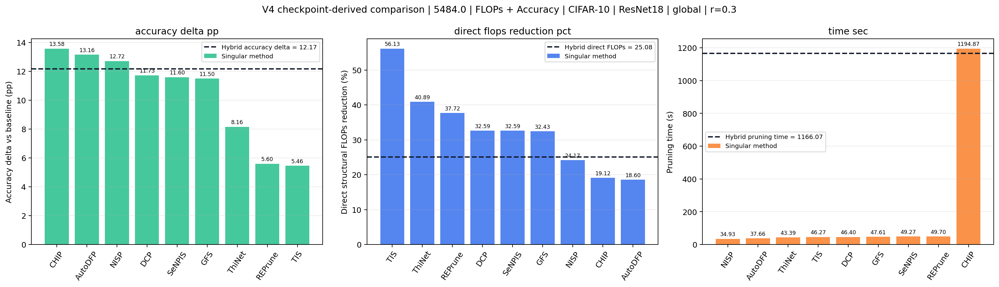

### Stack `9000.0` | rank 2.0 | r=0.3
FLOPs + Accuracy | CIFAR-10 | ResNet18 | global

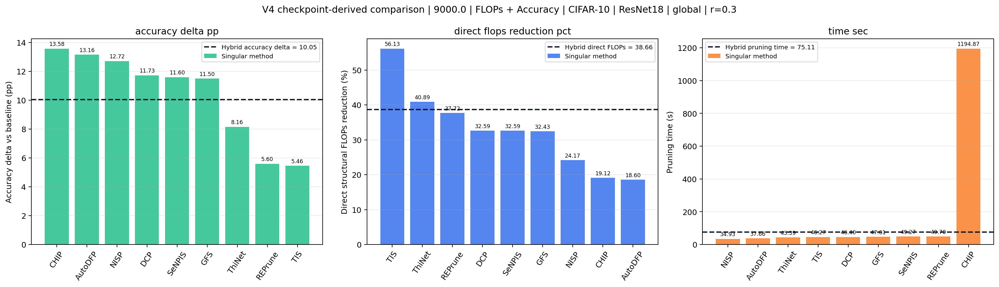

### Stack `9245.0` | rank 1.0 | r=0.45
FLOPs + Accuracy | CIFAR-10 | ResNet18 | global

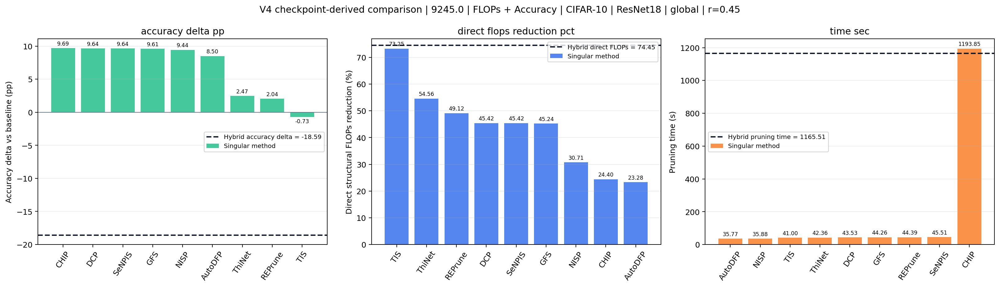

### Stack `4661.0` | rank 1.0 | r=0.55
FLOPs + Accuracy | CIFAR-10 | ResNet18 | global

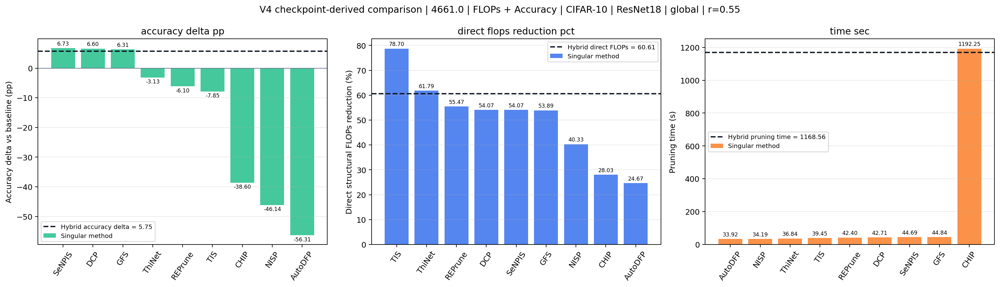

### Stack `3583.0` | rank 2.0 | r=0.55
FLOPs + Accuracy | CIFAR-10 | ResNet18 | global

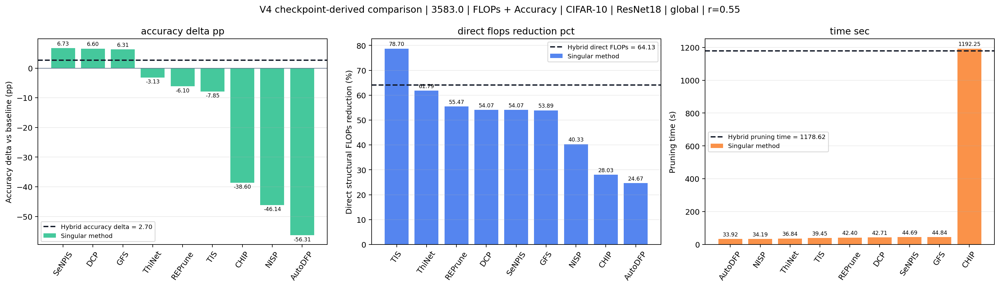

### Stack `7883.0` | rank 3.0 | r=0.55
FLOPs + Accuracy | CIFAR-10 | ResNet18 | global

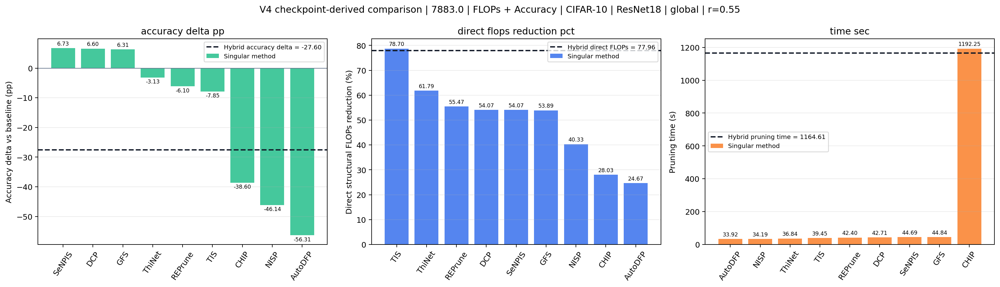

### Stack `6512.0` | rank 1.0 | r=0.55
FLOPs + Accuracy | CIFAR-10 | ResNet18 | local

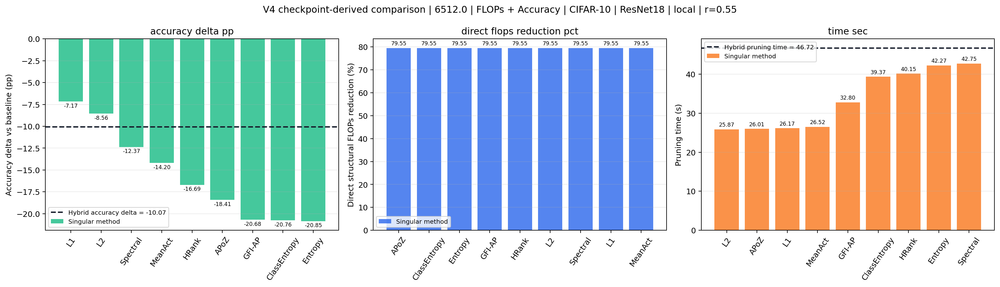

### Stack `1174.0` | rank 2.0 | r=0.55
FLOPs + Accuracy | CIFAR-10 | ResNet18 | local

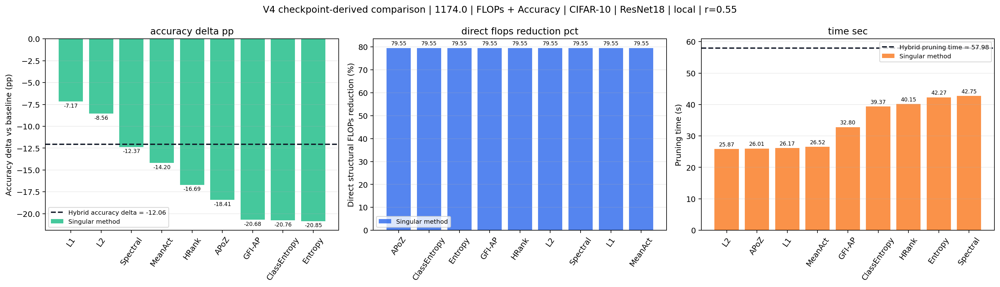

### Stack `6068.0` | rank 3.0 | r=0.55
FLOPs + Accuracy | CIFAR-10 | ResNet18 | local

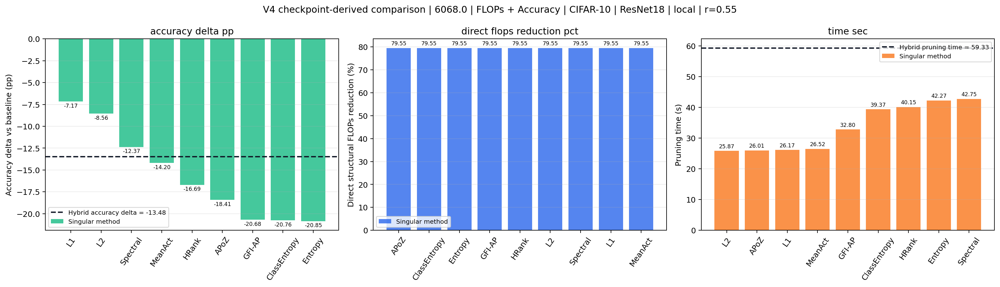

### Stack `9528.0` | rank 4.0 | r=0.55
FLOPs + Accuracy | CIFAR-10 | ResNet18 | local

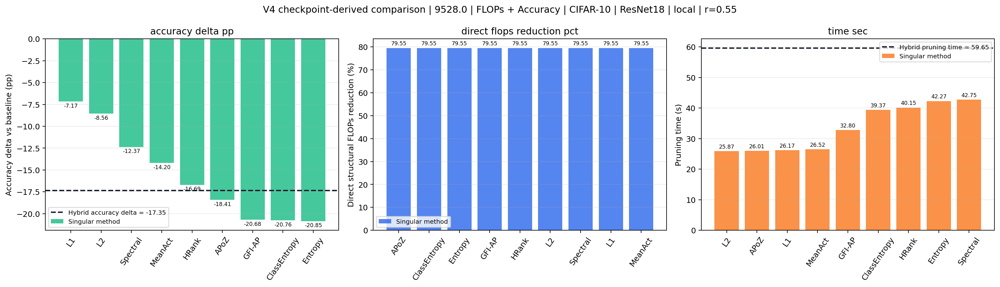

### Stack `5961.0` | rank 1.0 | r=0.3
FLOPs + Accuracy | CIFAR-10 | VGG16 | global

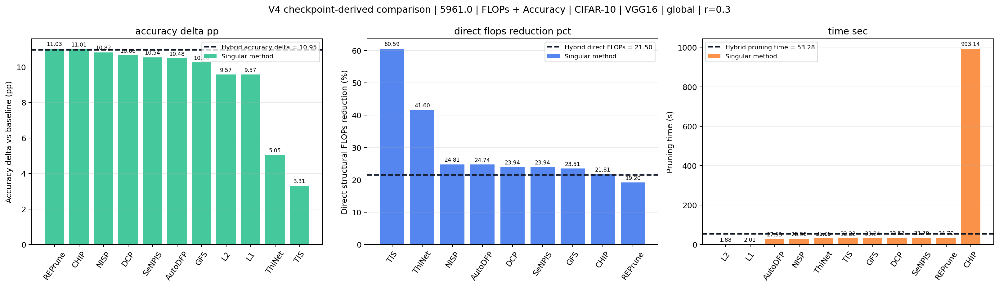

### Stack `9599.0` | rank 2.0 | r=0.3
FLOPs + Accuracy | CIFAR-10 | VGG16 | global

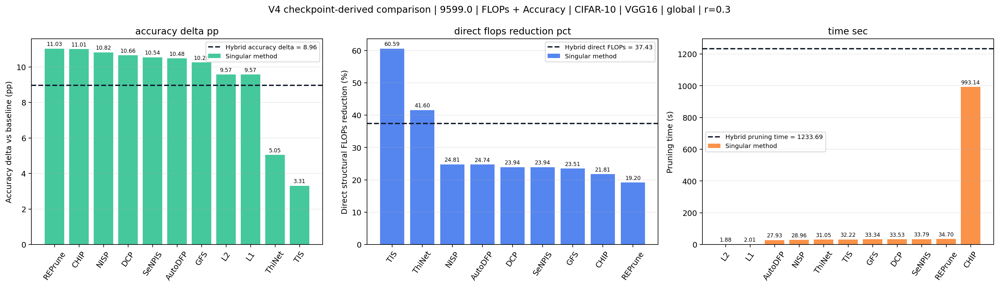

### Stack `7910.0` | rank 3.0 | r=0.3
FLOPs + Accuracy | CIFAR-10 | VGG16 | global

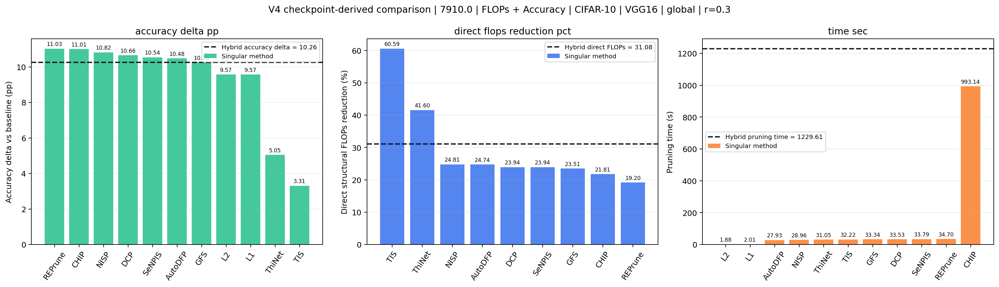

### Stack `5502.0` | rank 4.0 | r=0.3
FLOPs + Accuracy | CIFAR-10 | VGG16 | global

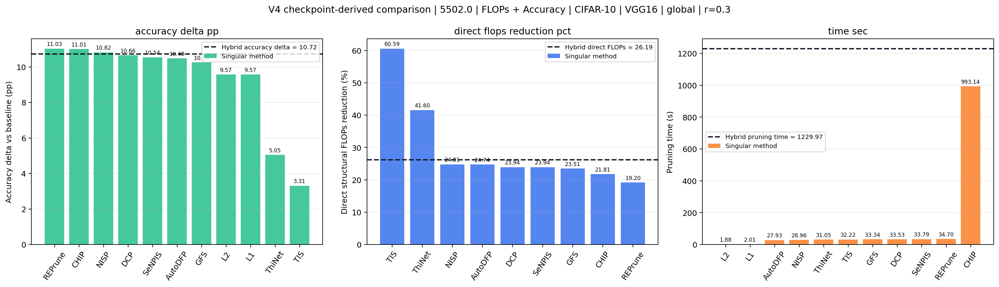

### Stack `6256.0` | rank 1.0 | r=0.45
FLOPs + Accuracy | CIFAR-10 | VGG16 | global

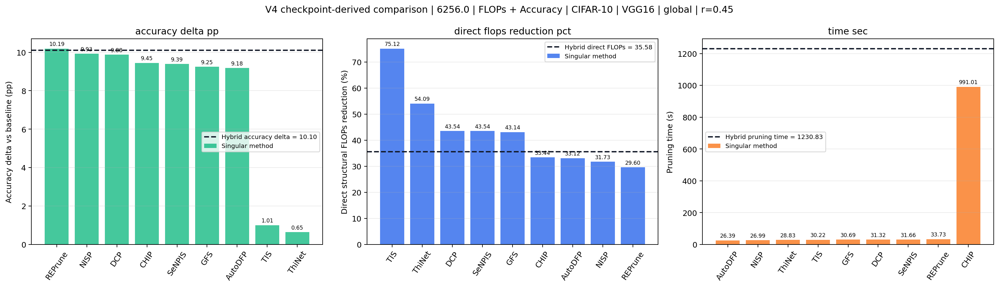

### Stack `4008.0` | rank 2.0 | r=0.45
FLOPs + Accuracy | CIFAR-10 | VGG16 | global

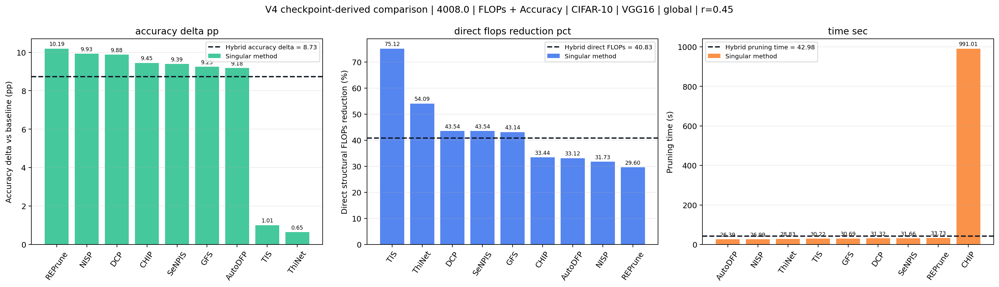

### Stack `5036.0` | rank 3.0 | r=0.45
FLOPs + Accuracy | CIFAR-10 | VGG16 | global

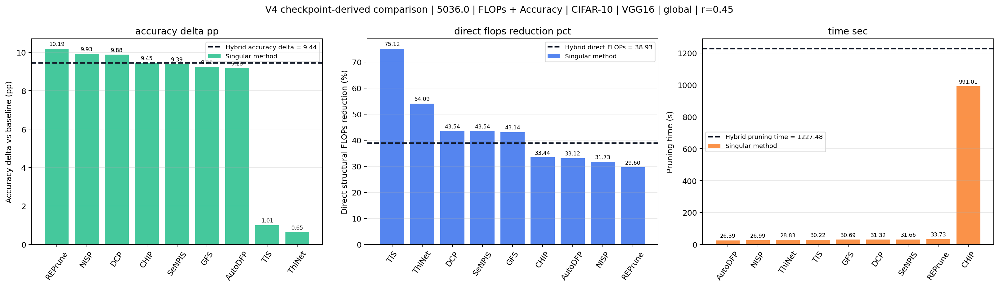

### Stack `3205.0` | rank 4.0 | r=0.45
FLOPs + Accuracy | CIFAR-10 | VGG16 | global

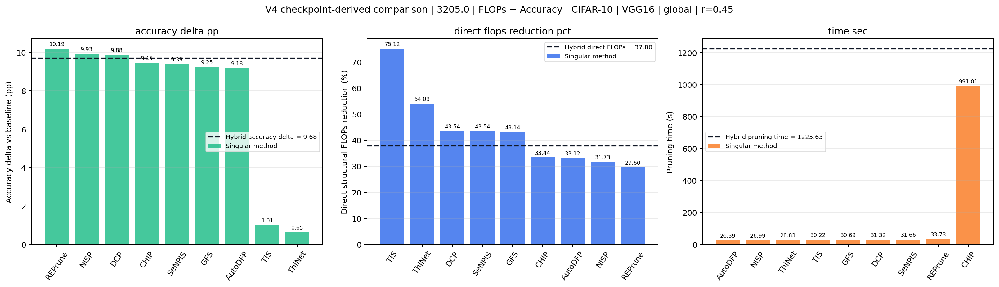

### Stack `9963.0` | rank 1.0 | r=0.55
FLOPs + Accuracy | CIFAR-10 | VGG16 | global

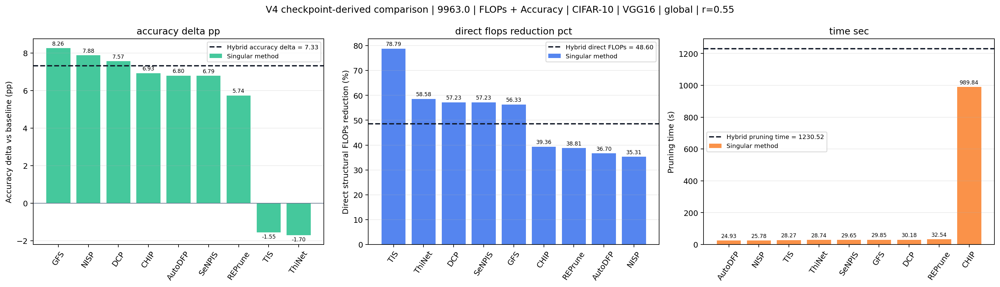

### Stack `1957.0` | rank 2.0 | r=0.55
FLOPs + Accuracy | CIFAR-10 | VGG16 | global

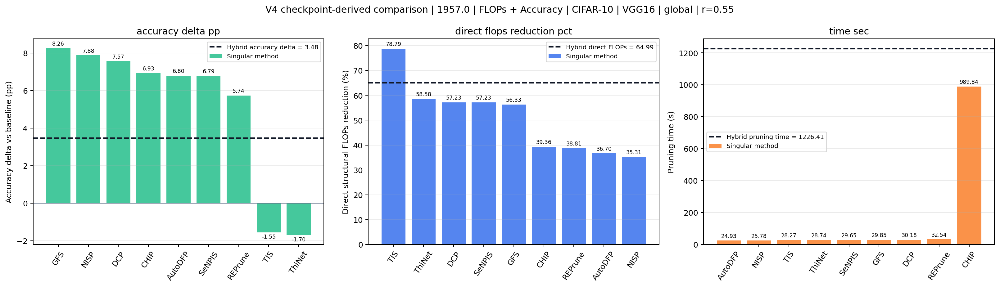

### Stack `8802.0` | rank 3.0 | r=0.55
FLOPs + Accuracy | CIFAR-10 | VGG16 | global

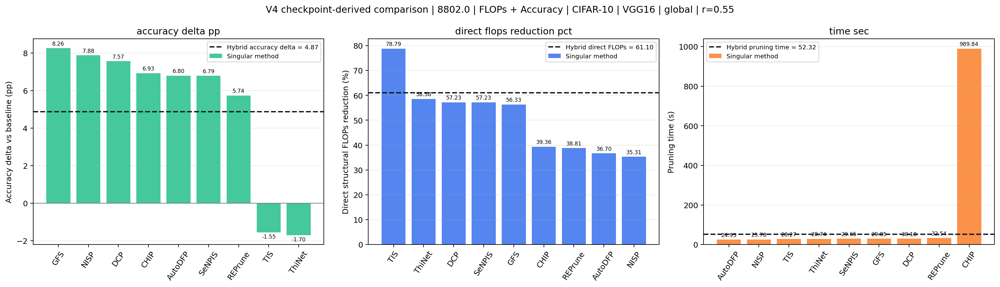

### Stack `1951.0` | rank 4.0 | r=0.55
FLOPs + Accuracy | CIFAR-10 | VGG16 | global

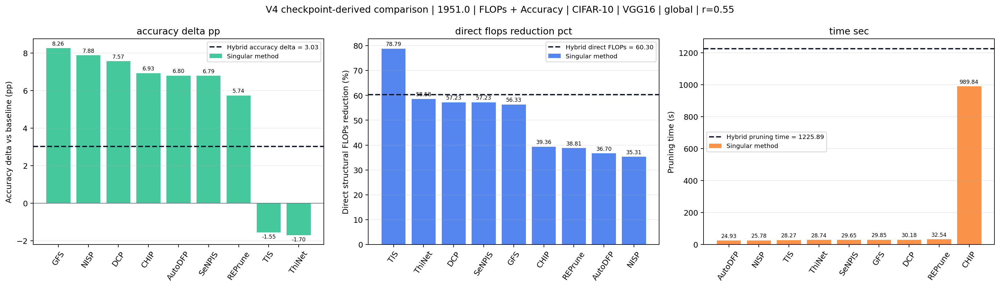

### Stack `8196.0` | rank 1.0 | r=0.3
FLOPs + Accuracy | CIFAR-10 | VGG16 | local

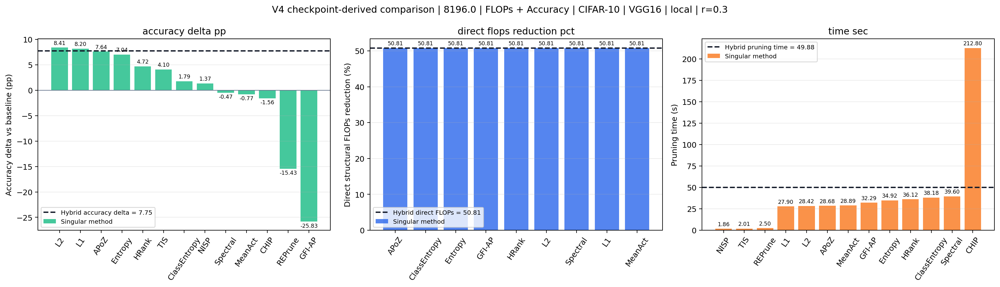

### Stack `2211.0` | rank 2.0 | r=0.3
FLOPs + Accuracy | CIFAR-10 | VGG16 | local

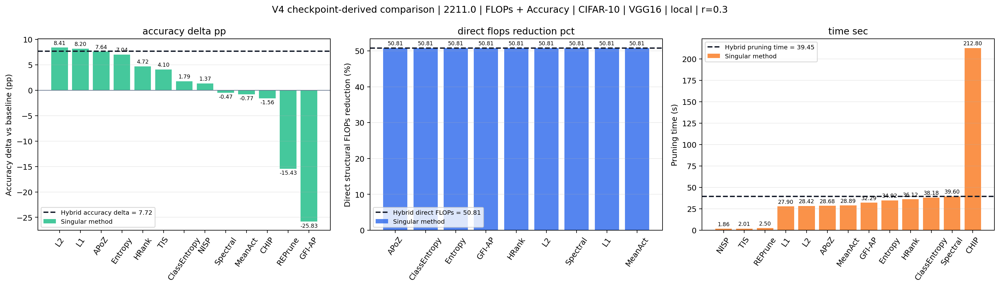

### Stack `1892.0` | rank 3.0 | r=0.3
FLOPs + Accuracy | CIFAR-10 | VGG16 | local

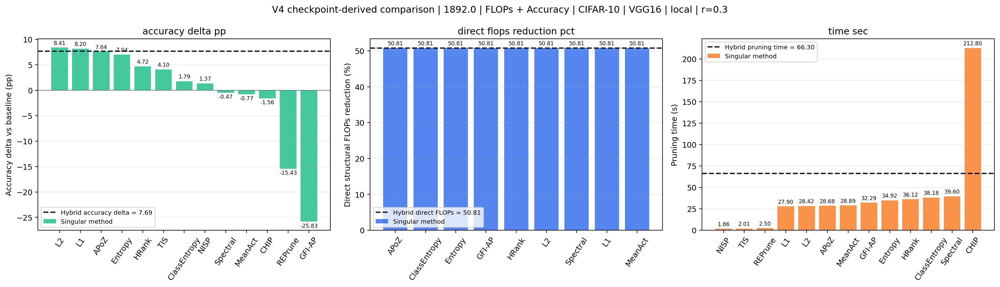

### Stack `8248.0` | rank 4.0 | r=0.3
FLOPs + Accuracy | CIFAR-10 | VGG16 | local

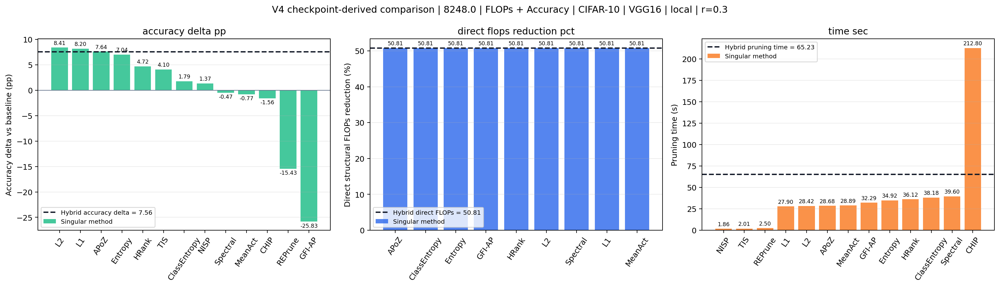

### Stack `9823.0` | rank 1.0 | r=0.45
FLOPs + Accuracy | CIFAR-10 | VGG16 | local

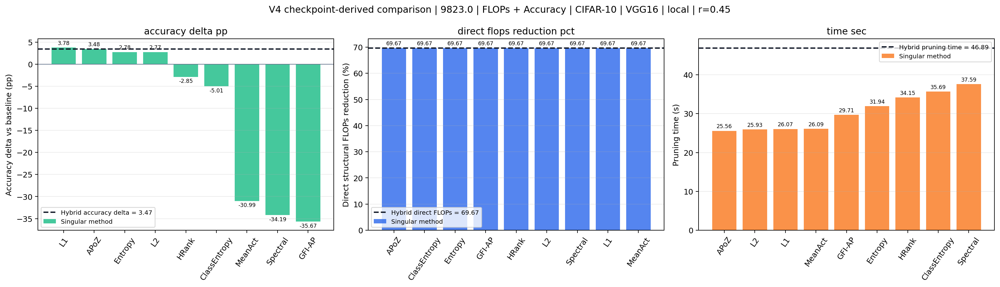

### Stack `8677.0` | rank 2.0 | r=0.45
FLOPs + Accuracy | CIFAR-10 | VGG16 | local

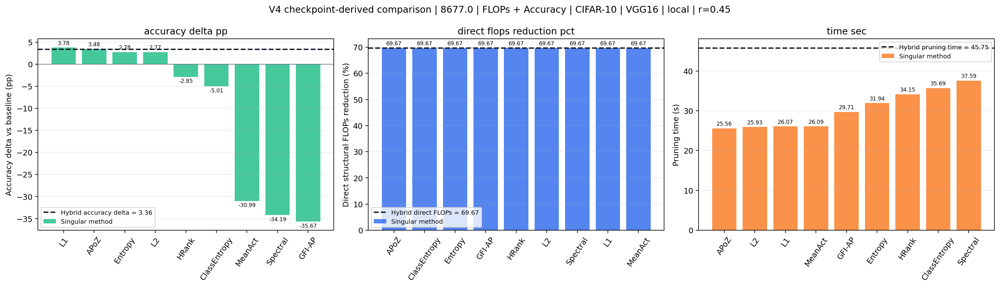

### Stack `7794.0` | rank 3.0 | r=0.45
FLOPs + Accuracy | CIFAR-10 | VGG16 | local

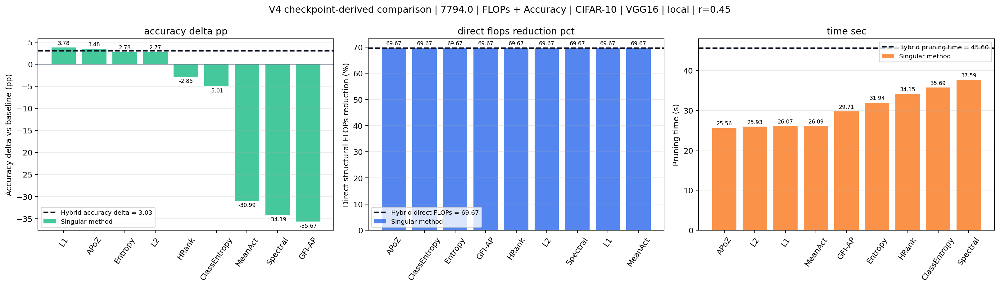

### Stack `9932.0` | rank 4.0 | r=0.45
FLOPs + Accuracy | CIFAR-10 | VGG16 | local

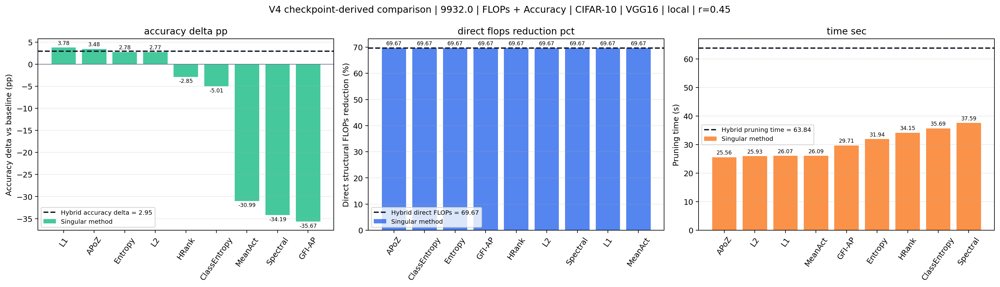

### Stack `1465.0` | rank 1.0 | r=0.55
FLOPs + Accuracy | CIFAR-10 | VGG16 | local

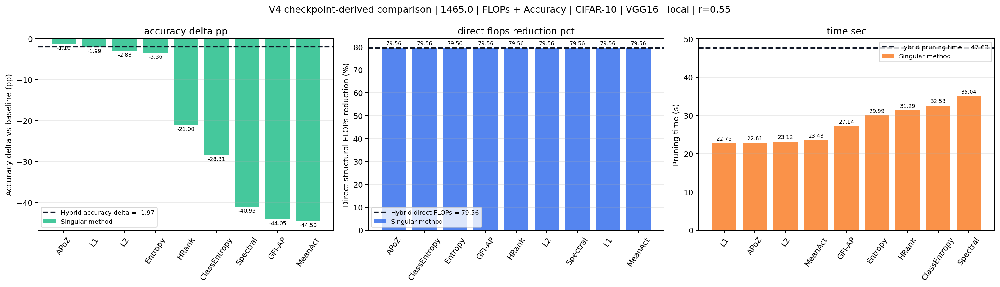

### Stack `1403.0` | rank 2.0 | r=0.55
FLOPs + Accuracy | CIFAR-10 | VGG16 | local

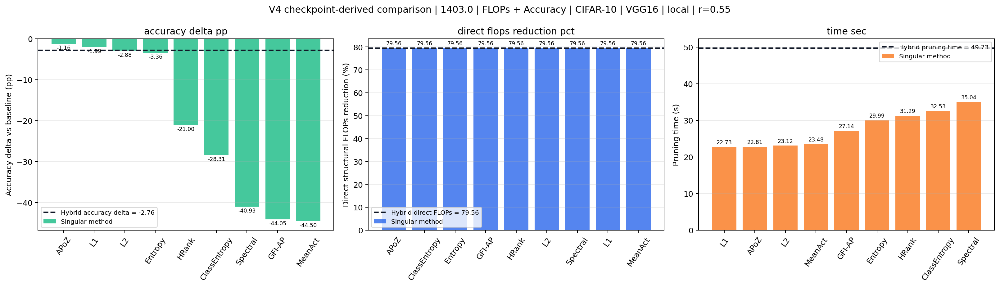

### Stack `8174.0` | rank 3.0 | r=0.55
FLOPs + Accuracy | CIFAR-10 | VGG16 | local

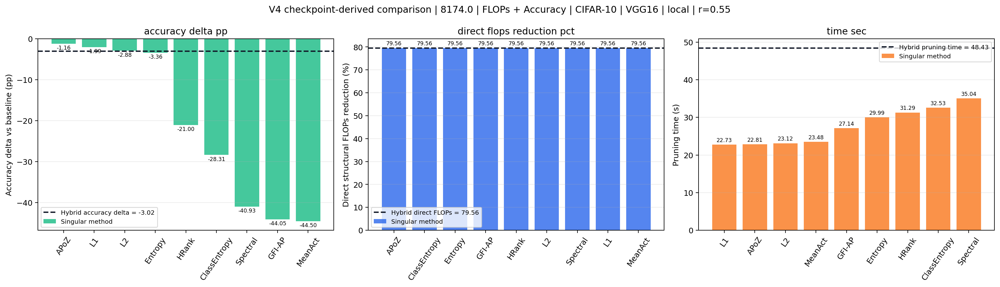

### Stack `4750.0` | rank 4.0 | r=0.55
FLOPs + Accuracy | CIFAR-10 | VGG16 | local

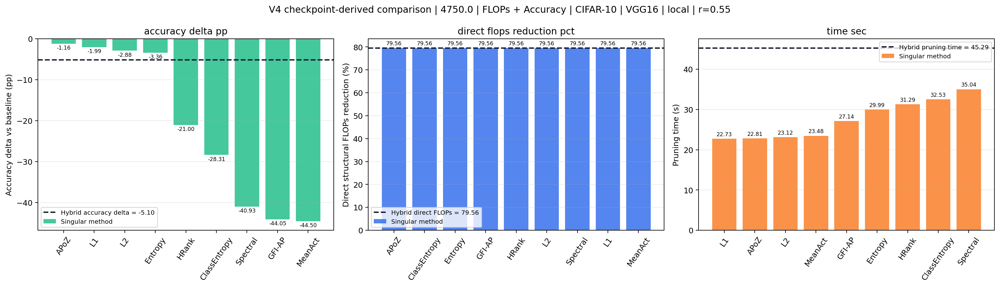

### Stack `5062.0` | rank 1.0 | r=0.3
FLOPs + Accuracy | Cats-vs-Dogs | ResNet18 | global

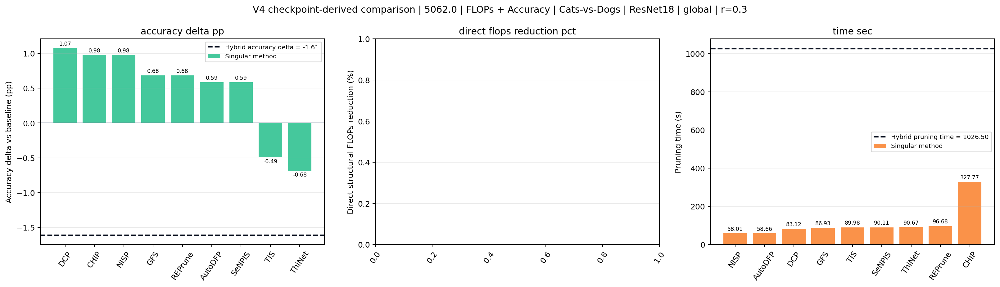

### Stack `5356.0` | rank 1.0 | r=0.45
FLOPs + Accuracy | Cats-vs-Dogs | ResNet18 | global

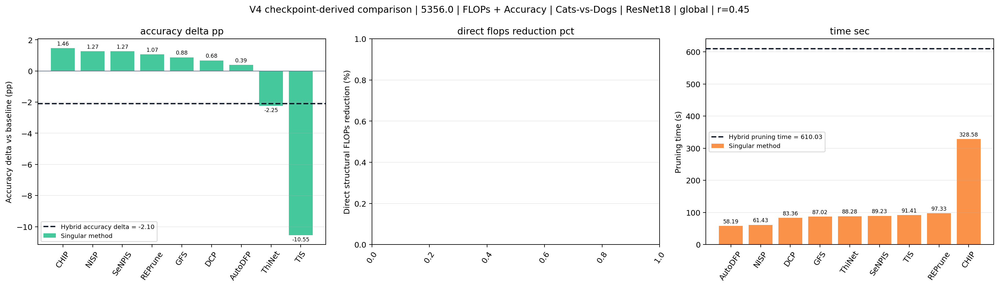

### Stack `7065.0` | rank 1.0 | r=0.55
FLOPs + Accuracy | Cats-vs-Dogs | ResNet18 | global

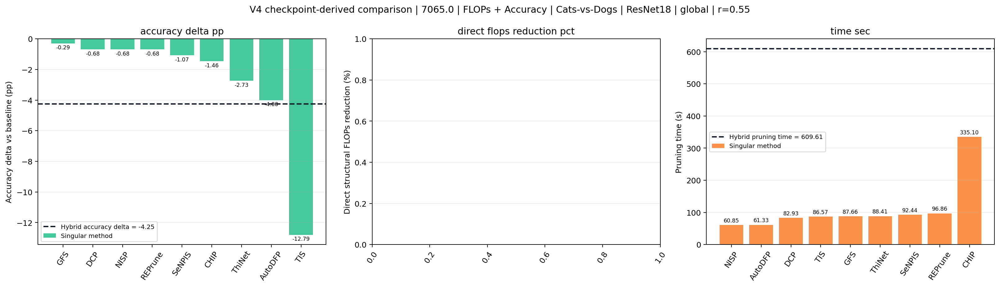

### Stack `1473.0` | rank 1.0 | r=0.3
FLOPs + Accuracy | Cats-vs-Dogs | ResNet18 | local

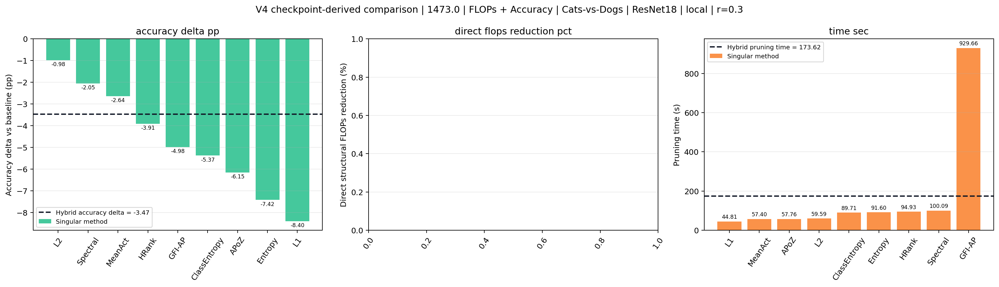

### Stack `9988.0` | rank 1.0 | r=0.45
FLOPs + Accuracy | Cats-vs-Dogs | ResNet18 | local

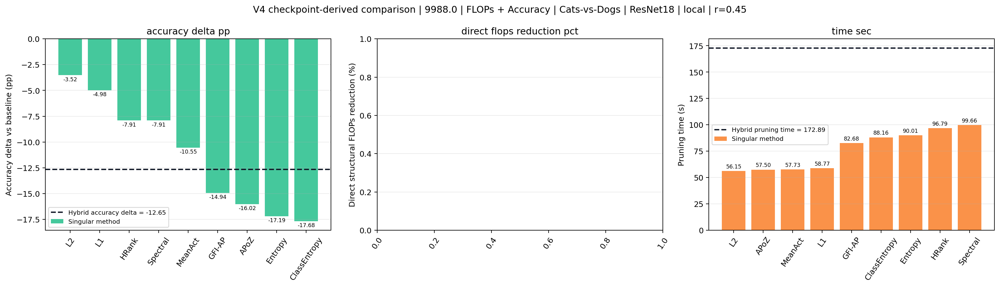

### Stack `2961.0` | rank 1.0 | r=0.55
FLOPs + Accuracy | Cats-vs-Dogs | ResNet18 | local

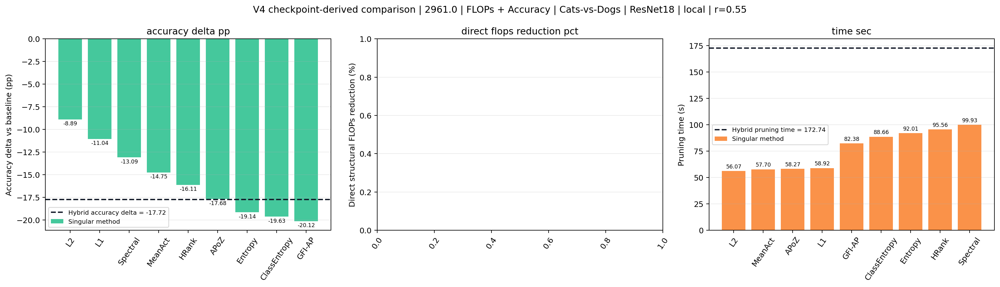

### Stack `7774.0` | rank 1.0 | r=0.3
FLOPs + Accuracy | Cats-vs-Dogs | VGG16 | local

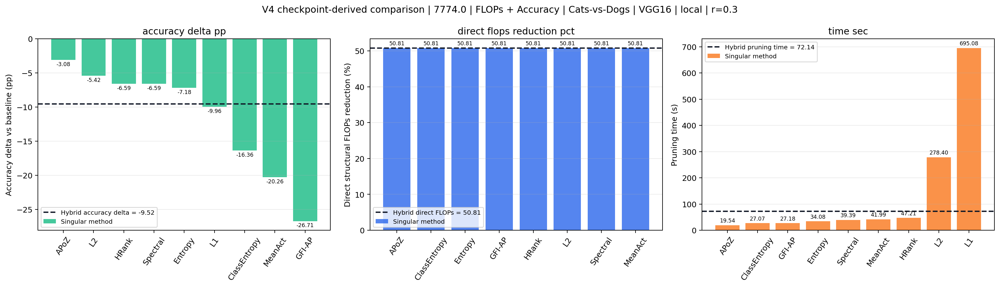

### Stack `2402.0` | rank 1.0 | r=0.3
FLOPs + Time + Accuracy | CIFAR-10 | ResNet18 | local

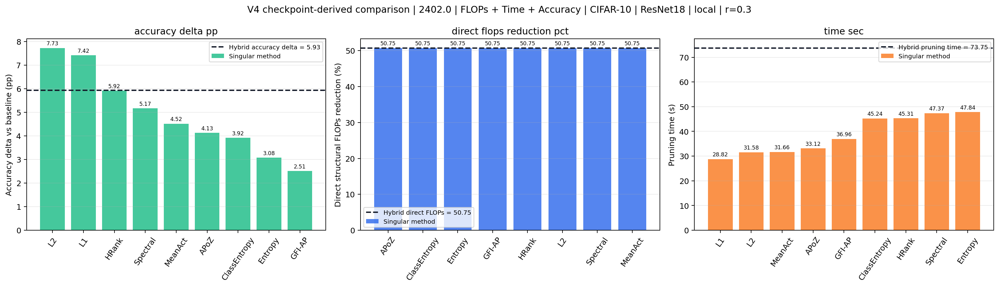

### Stack `7463.0` | rank 2.0 | r=0.3
FLOPs + Time + Accuracy | CIFAR-10 | ResNet18 | local

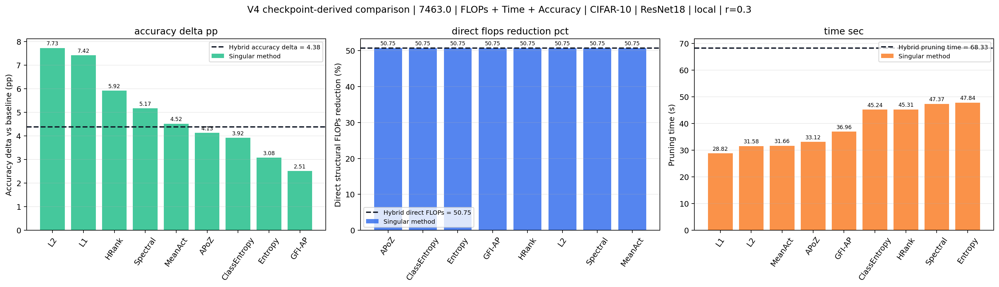

### Stack `8279.0` | rank 3.0 | r=0.3
FLOPs + Time + Accuracy | CIFAR-10 | ResNet18 | local

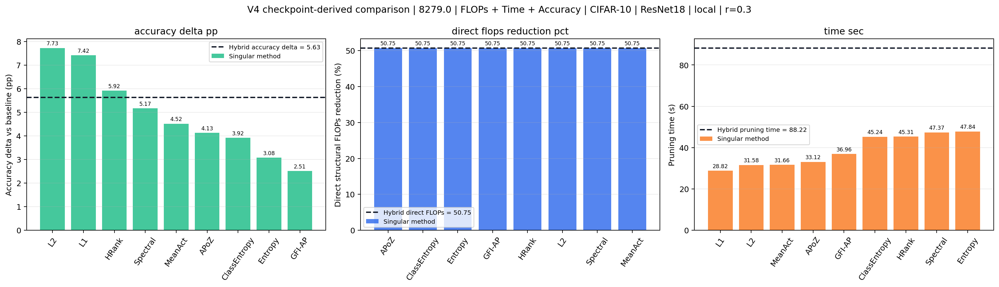

### Stack `3301.0` | rank 4.0 | r=0.3
FLOPs + Time + Accuracy | CIFAR-10 | ResNet18 | local

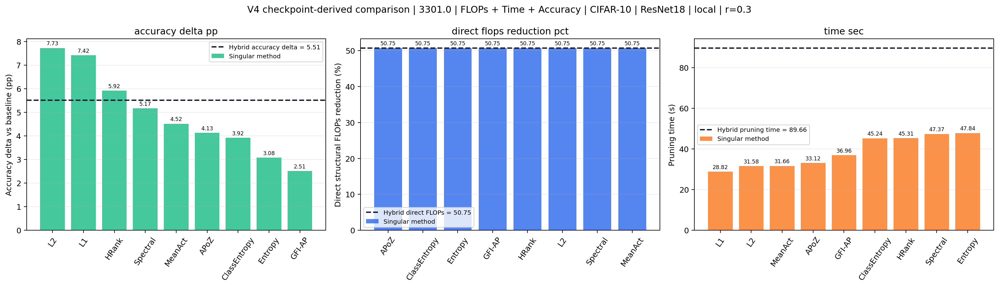

### Stack `3512.0` | rank 1.0 | r=0.45
FLOPs + Time + Accuracy | CIFAR-10 | ResNet18 | local

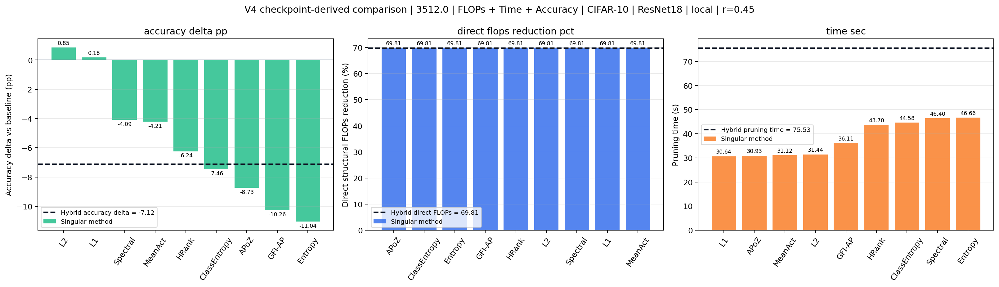

### Stack `9800.0` | rank 2.0 | r=0.45
FLOPs + Time + Accuracy | CIFAR-10 | ResNet18 | local

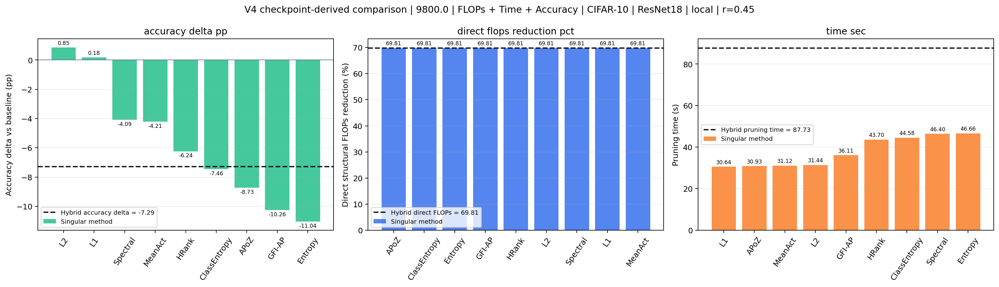

### Stack `4403.0` | rank 1.0 | r=0.3
FLOPs + Time + Accuracy | CIFAR-10 | VGG16 | global

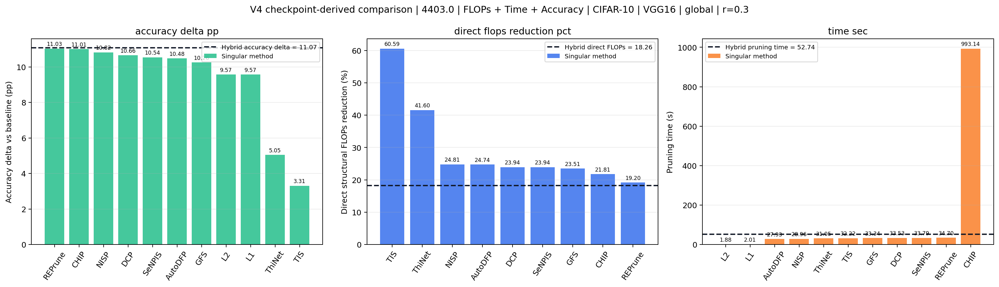

### Stack `9683.0` | rank 2.0 | r=0.3
FLOPs + Time + Accuracy | CIFAR-10 | VGG16 | global

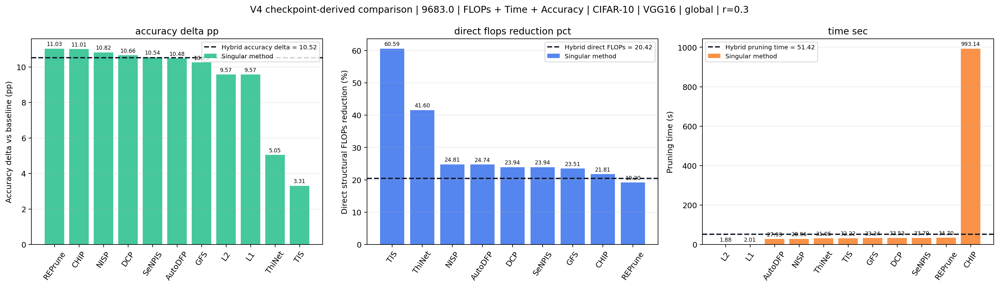

### Stack `8074.0` | rank 3.0 | r=0.3
FLOPs + Time + Accuracy | CIFAR-10 | VGG16 | global

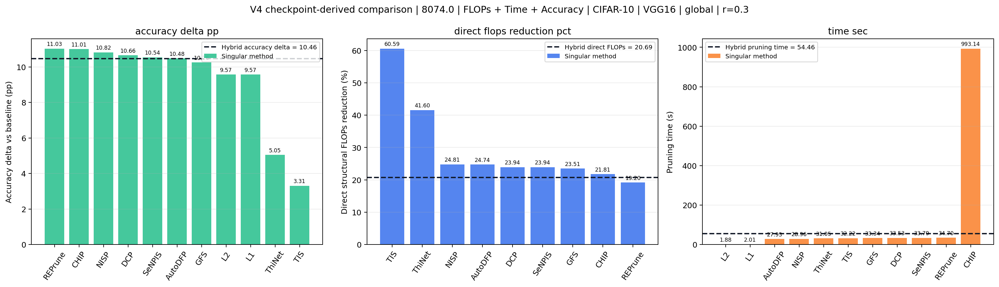

### Stack `7515.0` | rank 4.0 | r=0.3
FLOPs + Time + Accuracy | CIFAR-10 | VGG16 | global

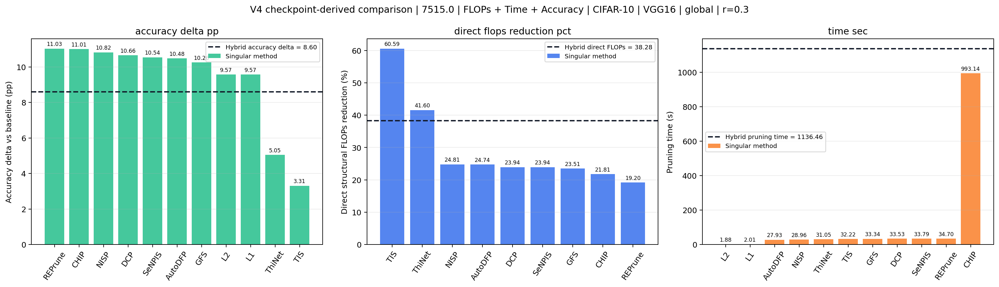

### Stack `4338.0` | rank 1.0 | r=0.45
FLOPs + Time + Accuracy | CIFAR-10 | VGG16 | global

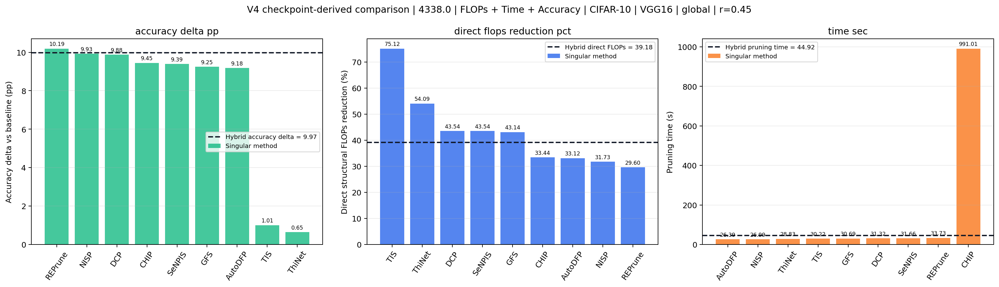

### Stack `4119.0` | rank 2.0 | r=0.45
FLOPs + Time + Accuracy | CIFAR-10 | VGG16 | global

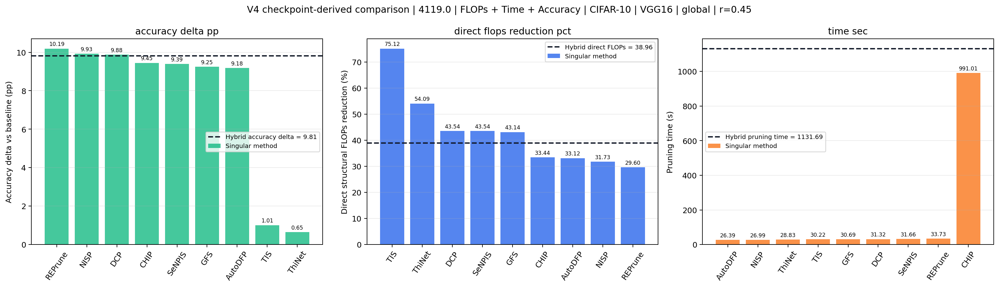

### Stack `5221.0` | rank 3.0 | r=0.45
FLOPs + Time + Accuracy | CIFAR-10 | VGG16 | global

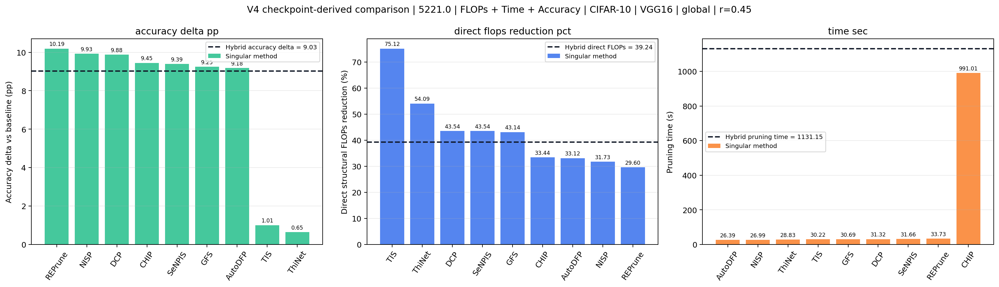

### Stack `8427.0` | rank 4.0 | r=0.45
FLOPs + Time + Accuracy | CIFAR-10 | VGG16 | global

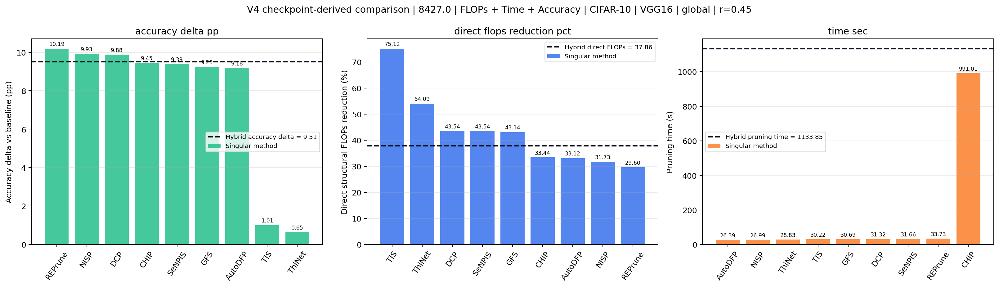

### Stack `3897.0` | rank 1.0 | r=0.55
FLOPs + Time + Accuracy | CIFAR-10 | VGG16 | global

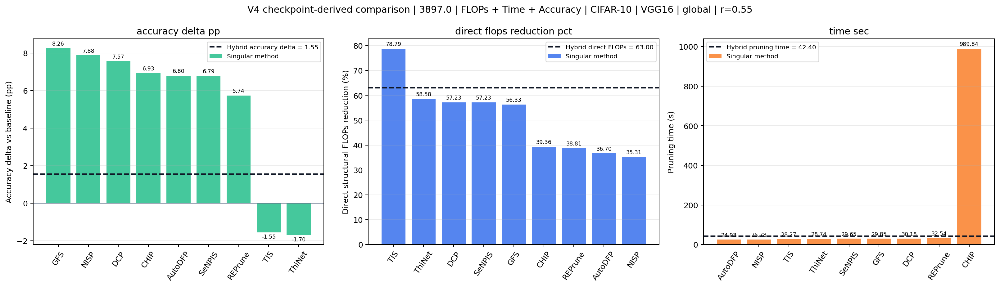

### Stack `8917.0` | rank 2.0 | r=0.55
FLOPs + Time + Accuracy | CIFAR-10 | VGG16 | global

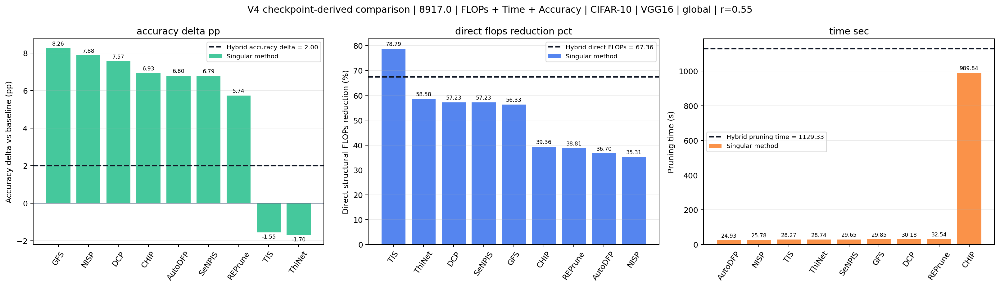

### Stack `1544.0` | rank 3.0 | r=0.55
FLOPs + Time + Accuracy | CIFAR-10 | VGG16 | global

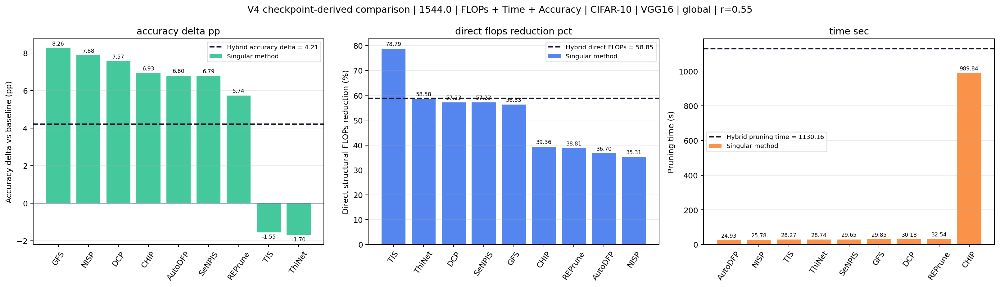

### Stack `7428.0` | rank 4.0 | r=0.55
FLOPs + Time + Accuracy | CIFAR-10 | VGG16 | global

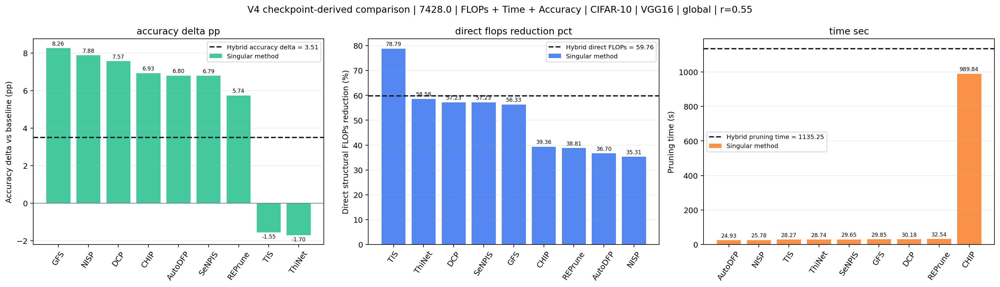

### Stack `8495.0` | rank 1.0 | r=0.3
FLOPs + Time + Accuracy | CIFAR-10 | VGG16 | local

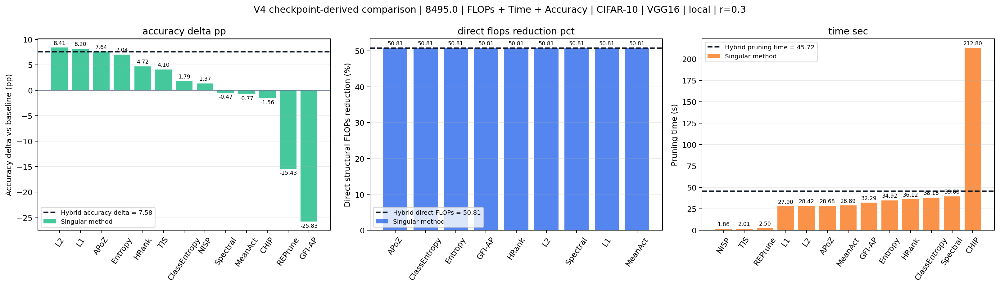

### Stack `6964.0` | rank 2.0 | r=0.3
FLOPs + Time + Accuracy | CIFAR-10 | VGG16 | local

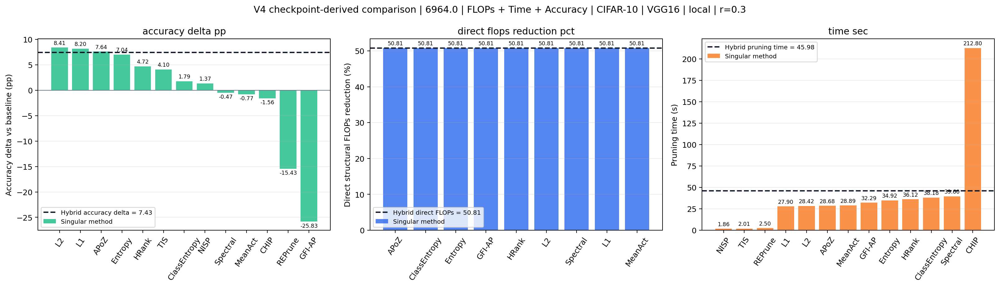

### Stack `1562.0` | rank 3.0 | r=0.3
FLOPs + Time + Accuracy | CIFAR-10 | VGG16 | local

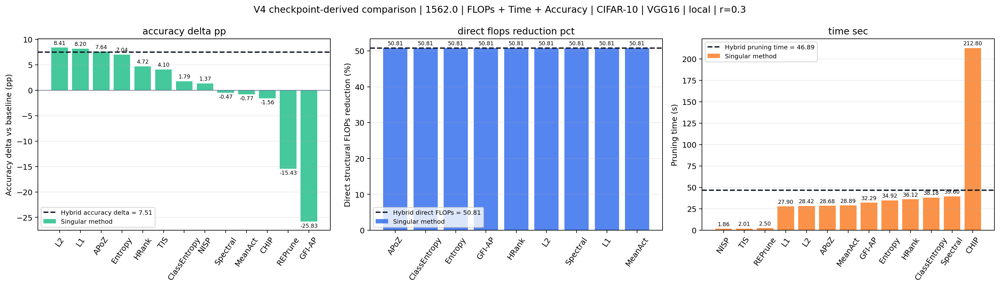

### Stack `2343.0` | rank 4.0 | r=0.3
FLOPs + Time + Accuracy | CIFAR-10 | VGG16 | local

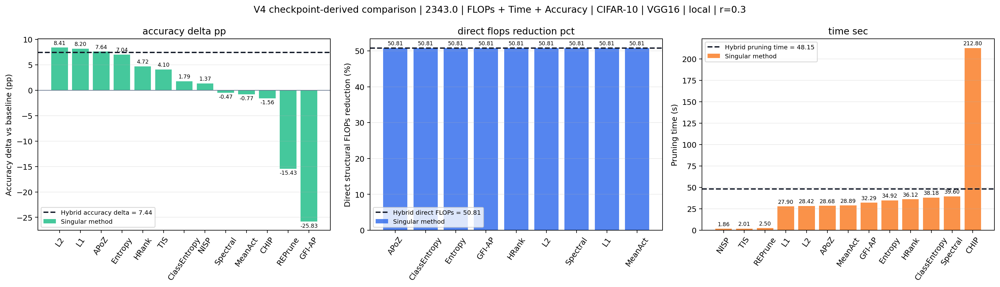

### Stack `7466.0` | rank 1.0 | r=0.45
FLOPs + Time + Accuracy | CIFAR-10 | VGG16 | local

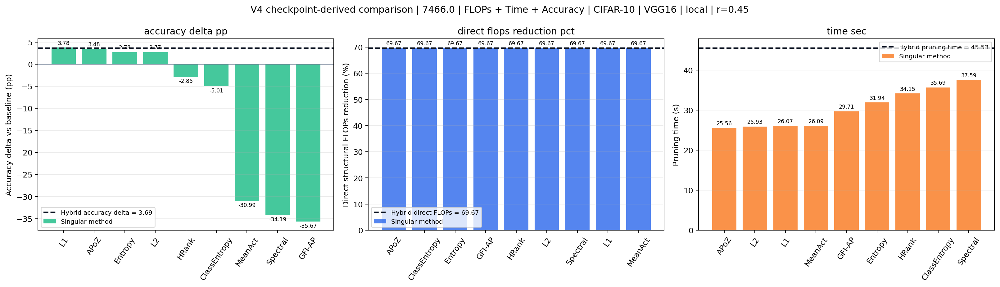

### Stack `5585.0` | rank 2.0 | r=0.45
FLOPs + Time + Accuracy | CIFAR-10 | VGG16 | local

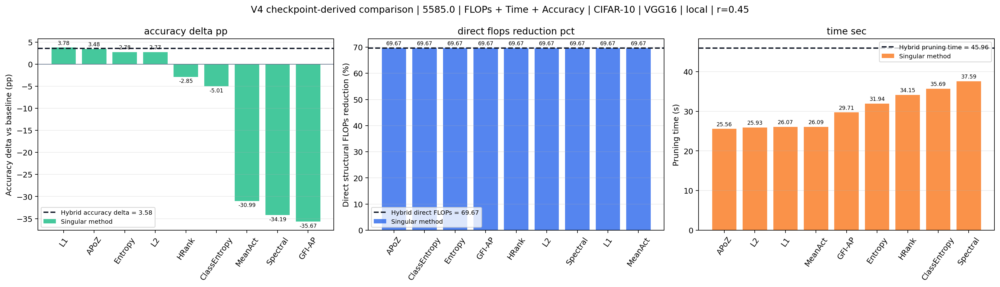

### Stack `8963.0` | rank 3.0 | r=0.45
FLOPs + Time + Accuracy | CIFAR-10 | VGG16 | local

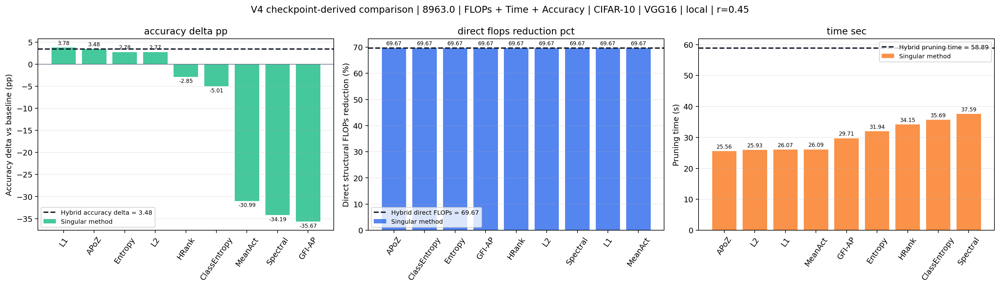

### Stack `9555.0` | rank 4.0 | r=0.45
FLOPs + Time + Accuracy | CIFAR-10 | VGG16 | local

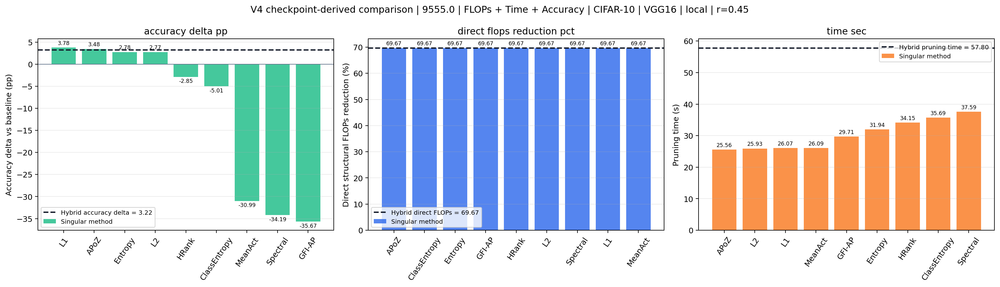

### Stack `3536.0` | rank 1.0 | r=0.55
FLOPs + Time + Accuracy | CIFAR-10 | VGG16 | local

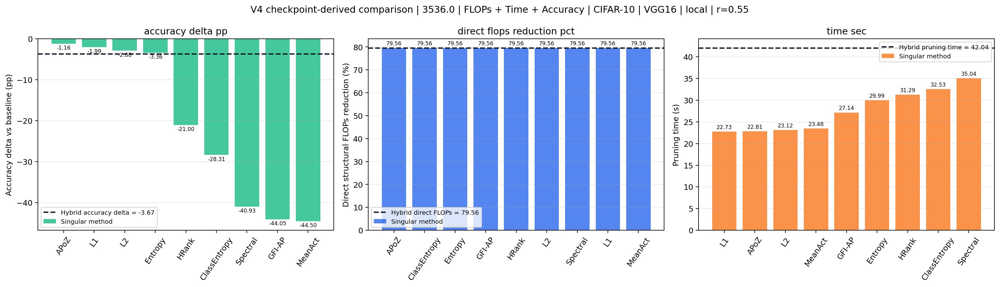

### Stack `7077.0` | rank 2.0 | r=0.55
FLOPs + Time + Accuracy | CIFAR-10 | VGG16 | local

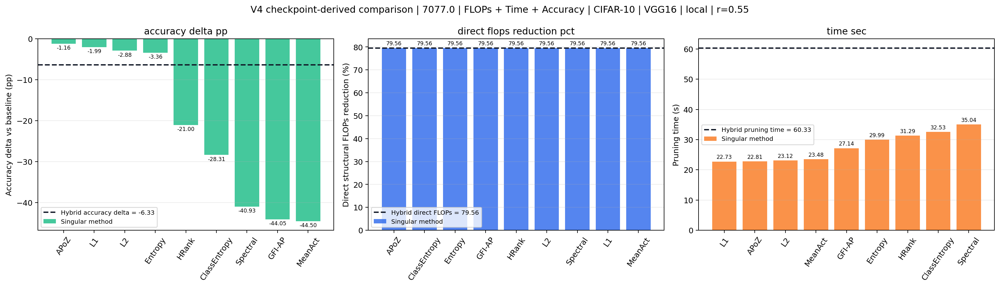

### Stack `8629.0` | rank 3.0 | r=0.55
FLOPs + Time + Accuracy | CIFAR-10 | VGG16 | local

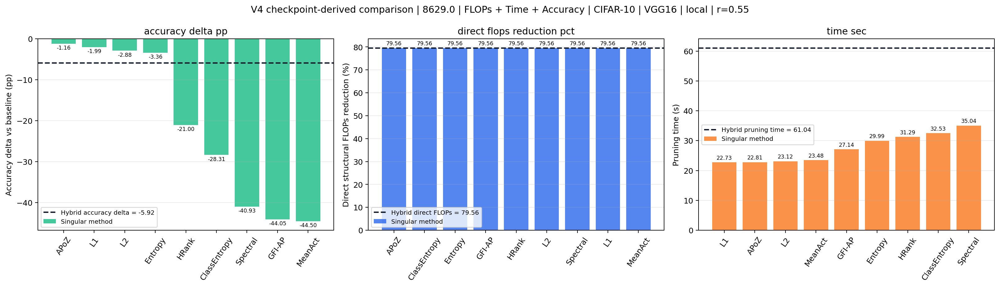

### Stack `6573.0` | rank 4.0 | r=0.55
FLOPs + Time + Accuracy | CIFAR-10 | VGG16 | local

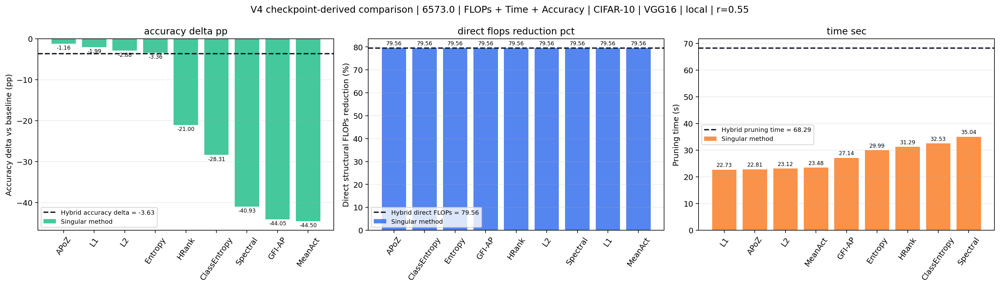

### Stack `8190.0` | rank 1.0 | r=0.3
FLOPs + Time + Accuracy | Cats-vs-Dogs | ResNet18 | global

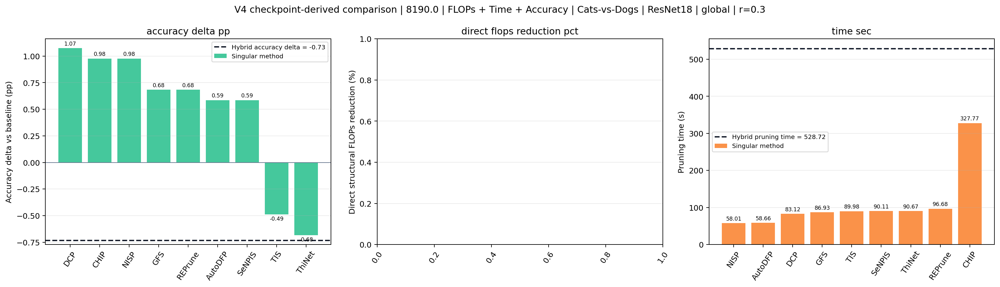

### Stack `2194.0` | rank 1.0 | r=0.45
FLOPs + Time + Accuracy | Cats-vs-Dogs | ResNet18 | global

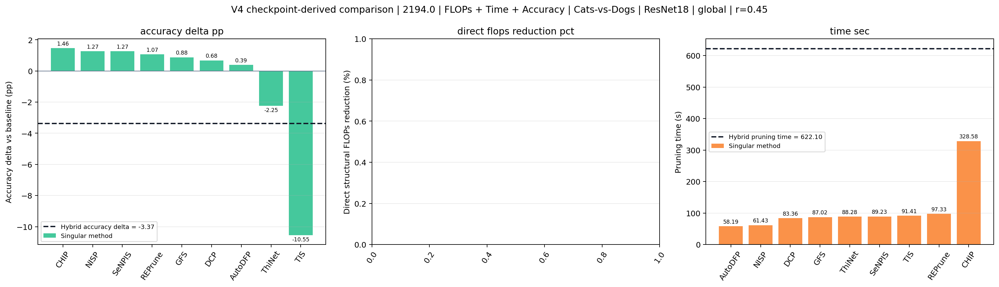

### Stack `9217.0` | rank 1.0 | r=0.55
FLOPs + Time + Accuracy | Cats-vs-Dogs | ResNet18 | global

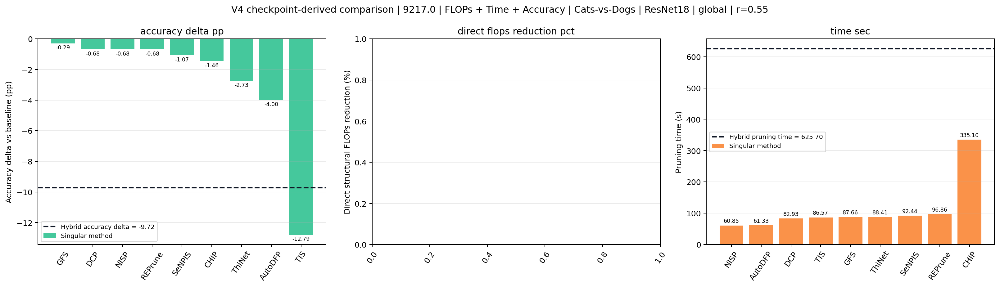

### Stack `9286.0` | rank 1.0 | r=0.3
FLOPs + Time + Accuracy | Cats-vs-Dogs | ResNet18 | local

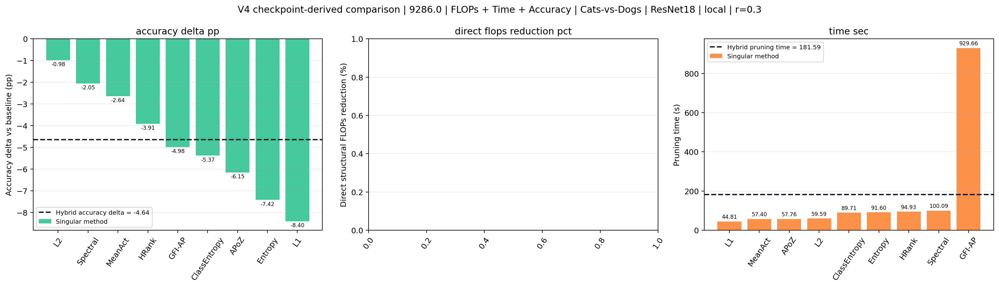

### Stack `4978.0` | rank 1.0 | r=0.45
FLOPs + Time + Accuracy | Cats-vs-Dogs | ResNet18 | local

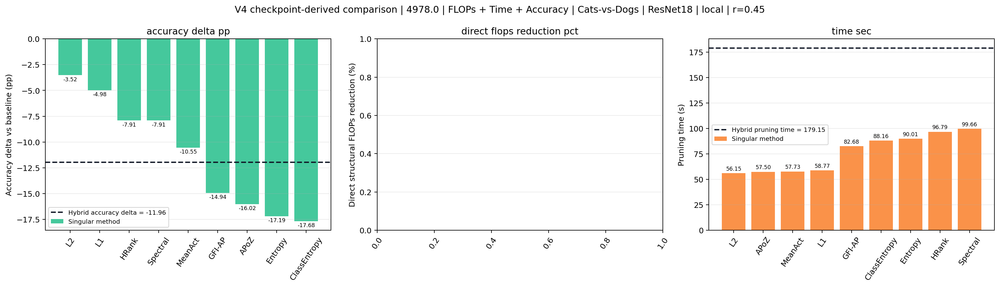

### Stack `3585.0` | rank 1.0 | r=0.55
FLOPs + Time + Accuracy | Cats-vs-Dogs | ResNet18 | local

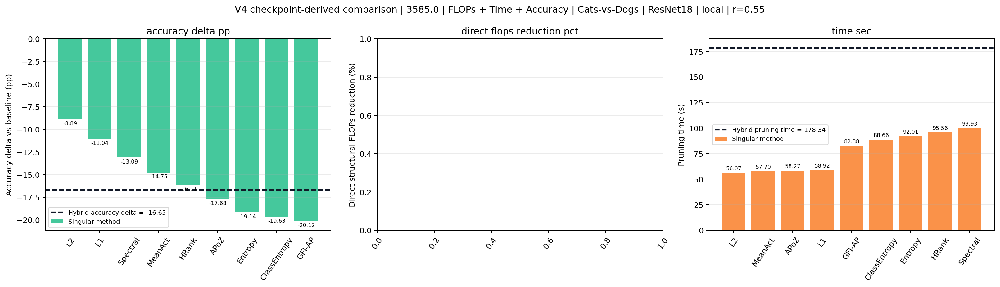

### Stack `8799.0` | rank 1.0 | r=0.3
FLOPs + Time + Accuracy | Cats-vs-Dogs | VGG16 | local

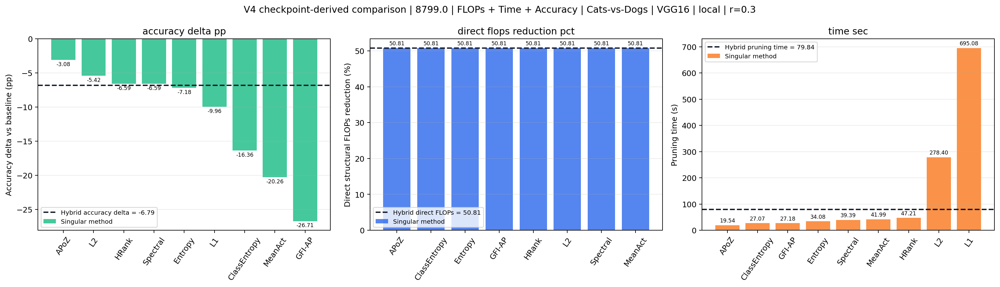

### Stack `3785.0` | rank 1.0 | r=0.3
Time + Accuracy | CIFAR-10 | ResNet18 | global

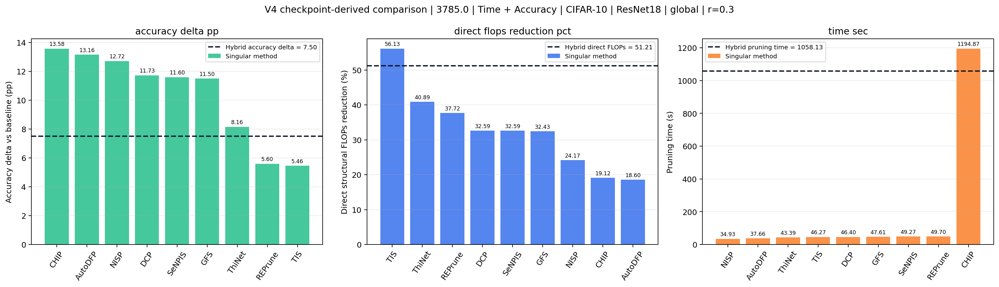

### Stack `2410.0` | rank 2.0 | r=0.3
Time + Accuracy | CIFAR-10 | ResNet18 | global

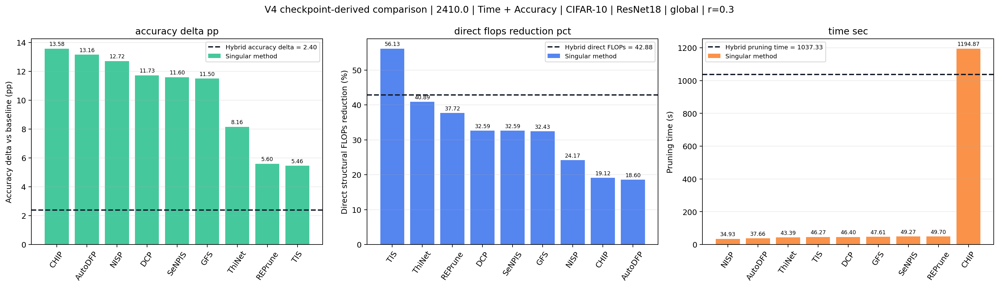

In [3]:
display(Markdown("## V4 checkpoint-derived comparison plots"))
if plot_manifest.empty:
    display(Markdown("No comparison plots were generated."))
else:
    plots = plot_manifest.copy()
    plots = plots.sort_values([c for c in CONTEXT_SORT if c in plots.columns], kind="mergesort")
    if MAX_INLINE_V4_COMPARISON_PLOTS not in (None, "all", "ALL"):
        plots = plots.head(int(MAX_INLINE_V4_COMPARISON_PLOTS))
    for _, row in plots.iterrows():
        path = Path(str(row.get("comparison_plot", "")))
        title = " | ".join(str(row.get(c, "")) for c in ["objective_label", "dataset", "model", "scope"] if c in row.index)
        display(Markdown(f"### Stack `{row.get('report_stack_id')}` | rank {row.get('context_rank')} | r={row.get('ratio')}\n{title}"))
        if path.exists():
            display(Image(filename=str(path)))
        else:
            display(Markdown(f"Missing plot file: `{path}`"))
        if not layerwise_direct_df.empty:
            mask = layerwise_direct_df.get("report_stack_id", pd.Series(dtype=str)).astype(str).eq(str(row.get("report_stack_id")))
            policy = layerwise_direct_df[mask].copy()
            cols = [c for c in ["report_stack_id", "context_rank", "layer_index", "region", "layer_name", "selected_method_display", "selected_method", "layer_prune_ratio", "direct_flops_reduction_pct", "direct_params_reduction_pct"] if c in policy.columns]
            if not policy.empty and cols:
                display(policy[cols].sort_values([c for c in ["layer_index", "layer_name"] if c in cols]).head(80))

In [4]:
display(Markdown("## Exact-context metric coverage"))
if metrics_df.empty:
    display(Markdown("No metrics available."))
else:
    coverage = metrics_df.groupby([c for c in ["objective_label", "dataset", "model", "scope", "ratio", "record_type"] if c in metrics_df.columns], dropna=False).agg(
        rows=("metric_status", "count"),
        ok_rows=("metric_status", lambda s: int((s.astype(str) == "ok").sum())),
        missing_or_failed_rows=("metric_status", lambda s: int((s.astype(str) != "ok").sum())),
    ).reset_index()
    display(coverage.sort_values([c for c in ["objective_label", "dataset", "model", "scope", "ratio", "record_type"] if c in coverage.columns], kind="mergesort").head(200))

## Exact-context metric coverage

,objective_label,dataset,model,scope,ratio,record_type,rows,ok_rows,missing_or_failed_rows
0,FLOPs + Accuracy,CIFAR-10,ResNet18,global,0.30,hybrid,2,2,0
1,FLOPs + Accuracy,CIFAR-10,ResNet18,global,0.45,hybrid,1,1,0
2,FLOPs + Accuracy,CIFAR-10,ResNet18,global,0.55,hybrid,3,3,0
3,FLOPs + Accuracy,CIFAR-10,ResNet18,local,0.55,hybrid,4,0,4
4,FLOPs + Accuracy,CIFAR-10,VGG16,global,0.30,hybrid,4,4,0
...,...,...,...,...,...,...,...,...,...
69,Time + Accuracy,Cats-vs-Dogs,ResNet18,local,0.45,hybrid,1,1,0
70,Time + Accuracy,Cats-vs-Dogs,ResNet18,local,0.55,hybrid,1,1,0
71,Time + Accuracy,Cats-vs-Dogs,VGG16,local,0.30,hybrid,1,1,0
72,Time + FLOPs,CIFAR-10,ResNet18,global,0.55,hybrid,4,0,4
